# 🔬 MBDA Assignment 1 — EDA & Machine Learning Pipeline (v2)
## Dataset: BreastCancerData.csv
### Models: XGBoost · Random Forest · SVM · ANN (PyTorch)
---
> **Perubahan dari v1:**
> - ✅ Transformasi: **Box-Cox** (bukan Yeo-Johnson) + auto epsilon-shift untuk nilai ≤ 0
> - ✅ Feature selection: **hanya eliminasi multikolinearitas** (tidak drop fitur lemah — biarkan regularisasi model yang menangani)
> - ✅ Normalisasi: **model-aware** — scaling hanya untuk SVM & ANN (RF & XGBoost tidak perlu)
> - ✅ Pipeline: **sklearn `Pipeline` object per model** (mencegah data leakage, clean & reproducible)

## ⚙️ SECTION 0: Setup, Import & GPU Detection

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import math, time, copy

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

import scipy.stats as stats
from scipy.stats import boxcox

from sklearn.preprocessing import (StandardScaler, LabelEncoder,
                                    PowerTransformer, MinMaxScaler)
from sklearn.decomposition import PCA
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Lasso, LassoCV
from sklearn.base import BaseEstimator, TransformerMixin

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline   # support SMOTE in pipeline

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import xgboost as xgb

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, WeightedRandomSampler

from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_curve, auc, precision_recall_curve,
    average_precision_score, accuracy_score,
    f1_score, precision_score, recall_score
)

try:
    import cuml
    from cuml.ensemble import RandomForestClassifier as cuRF
    from cuml.svm import SVC as cuSVC
    CUML_AVAILABLE = True
    print('✅ cuML (RAPIDS GPU) tersedia!')
except ImportError:
    CUML_AVAILABLE = False
    print('⚠️  cuML tidak tersedia — RF & SVM menggunakan sklearn (CPU)')

sns.set_theme(style='whitegrid', palette='muted', font_scale=1.1)
plt.rcParams.update({
    'figure.max_open_warning': 0,
    'figure.facecolor': 'white',
    'axes.facecolor': '#f8f9fa',
    'axes.grid': True,
    'grid.alpha': 0.35,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

PALETTE = {'B': '#2ecc71', 'M': '#e74c3c'}
COLORS  = ['#2ecc71', '#e74c3c']
SEED    = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
print('✅ Setup selesai!')

⚠️  cuML tidak tersedia — RF & SVM menggunakan sklearn (CPU)
✅ Setup selesai!


In [2]:
print('=' * 60)
print('🔧  GPU DETECTION')
print('=' * 60)
CUDA_AVAILABLE = torch.cuda.is_available()
DEVICE = torch.device('cuda' if CUDA_AVAILABLE else 'cpu')
print(f'PyTorch Device   : {DEVICE}')
if CUDA_AVAILABLE:
    gp = torch.cuda.get_device_properties(0)
    print(f'GPU Model        : {torch.cuda.get_device_name(0)}')
    print(f'CUDA Version     : {torch.version.cuda}')
    print(f'VRAM             : {gp.total_memory / 1e9:.2f} GB')
    XGB_DEVICE = 'cuda'
else:
    XGB_DEVICE = 'cpu'
torch.cuda.manual_seed_all(SEED) if CUDA_AVAILABLE else None
print('=' * 60)

🔧  GPU DETECTION
PyTorch Device   : cuda
GPU Model        : NVIDIA GeForce RTX 4050 Laptop GPU
CUDA Version     : 13.0
VRAM             : 6.44 GB


## 📂 SECTION 1: Data Loading & Inspeksi Awal

In [3]:
FILE_PATH  = 'BreastCancerData (4).csv'
TARGET_COL = 'diagnosis'

df = pd.read_csv(FILE_PATH)
unnamed_cols = [c for c in df.columns if 'Unnamed' in str(c)]
df.drop(columns=unnamed_cols + (['id'] if 'id' in df.columns else []), inplace=True)
print(f'✅ Dataset dimuat: {df.shape[0]} baris × {df.shape[1]} kolom')
display(df.head())
df.info()

✅ Dataset dimuat: 569 baris × 31 kolom


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


<class 'pandas.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    str    
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  569 non-null

## 🔍 SECTION 2: Data Integrity Check

In [4]:
print('=' * 60)
print('🔍  DATA INTEGRITY CHECK')
print('=' * 60)

missing = df.isnull().sum()
print(f'\n[1] Missing Values: {missing.sum()} total')
if missing.sum() > 0:
    print(missing[missing > 0])
    df.dropna(inplace=True)
else:
    print('   ✅ Tidak ada missing values.')

dupes = df.duplicated().sum()
print(f'[2] Duplikat: {dupes}  {"✅" if dupes == 0 else "⚠️ dihapus"}')
if dupes > 0:
    df.drop_duplicates(inplace=True)

feature_cols = [c for c in df.columns if c != TARGET_COL]
print(f'[3] Total Fitur: {len(feature_cols)}')

# Cek nilai minimum per fitur (penting untuk Box-Cox)
min_vals = df[feature_cols].min()
zero_feats    = min_vals[min_vals == 0].index.tolist()
neg_feats     = min_vals[min_vals < 0].index.tolist()
near_zero_feats = min_vals[(min_vals >= 0) & (min_vals < 1e-4)].index.tolist()

print(f'\n[4] Fitur dengan nilai = 0  : {zero_feats}')
print(f'    Fitur dengan nilai < 0   : {neg_feats}')
print(f'    Fitur dengan nilai < 1e-4: {near_zero_feats}')

print('\n📋 Statistik Deskriptif:')
display(df.describe().T.style
    .background_gradient(cmap='Blues', subset=['mean','std'])
    .format(precision=4)
)

🔍  DATA INTEGRITY CHECK

[1] Missing Values: 0 total
   ✅ Tidak ada missing values.
[2] Duplikat: 0  ✅
[3] Total Fitur: 30

[4] Fitur dengan nilai = 0  : ['concavity_mean', 'concave points_mean', 'concavity_se', 'concave points_se', 'concavity_worst', 'concave points_worst']
    Fitur dengan nilai < 0   : []
    Fitur dengan nilai < 1e-4: ['concavity_mean', 'concave points_mean', 'concavity_se', 'concave points_se', 'concavity_worst', 'concave points_worst']

📋 Statistik Deskriptif:


,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0000,14.1273,3.5240,6.9810,11.7000,13.3700,15.7800,28.1100
texture_mean,569.0000,19.2896,4.3010,9.7100,16.1700,18.8400,21.8000,39.2800
perimeter_mean,569.0000,91.9690,24.2990,43.7900,75.1700,86.2400,104.1000,188.5000
area_mean,569.0000,654.8891,351.9141,143.5000,420.3000,551.1000,782.7000,2501.0000
smoothness_mean,569.0000,0.0964,0.0141,0.0526,0.0864,0.0959,0.1053,0.1634
compactness_mean,569.0000,0.1043,0.0528,0.0194,0.0649,0.0926,0.1304,0.3454
concavity_mean,569.0000,0.0888,0.0797,0.0000,0.0296,0.0615,0.1307,0.4268
concave points_mean,569.0000,0.0489,0.0388,0.0000,0.0203,0.0335,0.0740,0.2012
symmetry_mean,569.0000,0.1812,0.0274,0.1060,0.1619,0.1792,0.1957,0.3040
fractal_dimension_mean,569.0000,0.0628,0.0071,0.0500,0.0577,0.0615,0.0661,0.0974


## 📊 SECTION 3: Distribusi Kelas Target

Benign (B)    : 357
Malignant (M) : 212
Imbalance Ratio: 1.68x  → SMOTE diperlukan


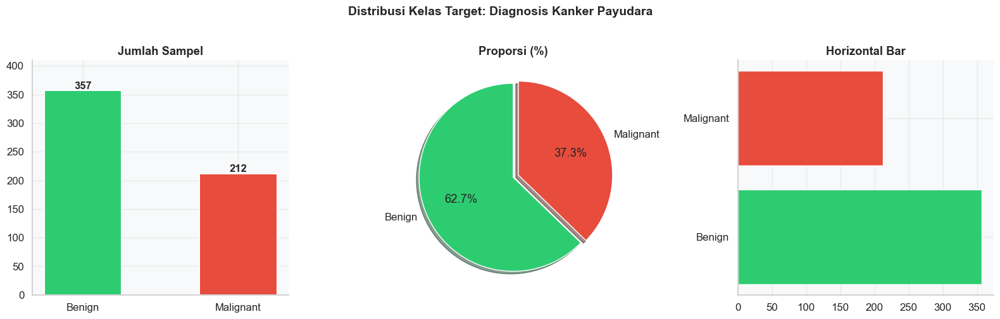

In [5]:
label_counts = df[TARGET_COL].value_counts().sort_index()
print(f'Benign (B)    : {label_counts.get("B", 0)}')
print(f'Malignant (M) : {label_counts.get("M", 0)}')
ir = label_counts.max() / label_counts.min()
print(f'Imbalance Ratio: {ir:.2f}x  {"→ SMOTE diperlukan" if ir > 1.5 else "→ cukup seimbang"}')

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Distribusi Kelas Target: Diagnosis Kanker Payudara',
             fontsize=14, fontweight='bold', y=1.01)

bars = axes[0].bar(['Benign', 'Malignant'], label_counts.values,
                   color=COLORS, edgecolor='white', linewidth=1.5, width=0.5)
axes[0].set_title('Jumlah Sampel', fontweight='bold')
for bar, v in zip(bars, label_counts.values):
    axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+3,
                 str(v), ha='center', fontweight='bold', fontsize=12)
axes[0].set_ylim(0, label_counts.max()*1.15)

axes[1].pie(label_counts.values, labels=['Benign','Malignant'],
            autopct='%1.1f%%', colors=COLORS, startangle=90,
            explode=(0, 0.06), shadow=True)
axes[1].set_title('Proporsi (%)', fontweight='bold')

axes[2].barh(['Benign','Malignant'], label_counts.values,
             color=COLORS, edgecolor='white')
axes[2].set_title('Horizontal Bar', fontweight='bold')
plt.tight_layout(); plt.show()

## 📈 SECTION 4–6: EDA Visualisasi (Histogram, Box Plot, Violin)
*(Kode identik dengan v1 — dipertahankan)*

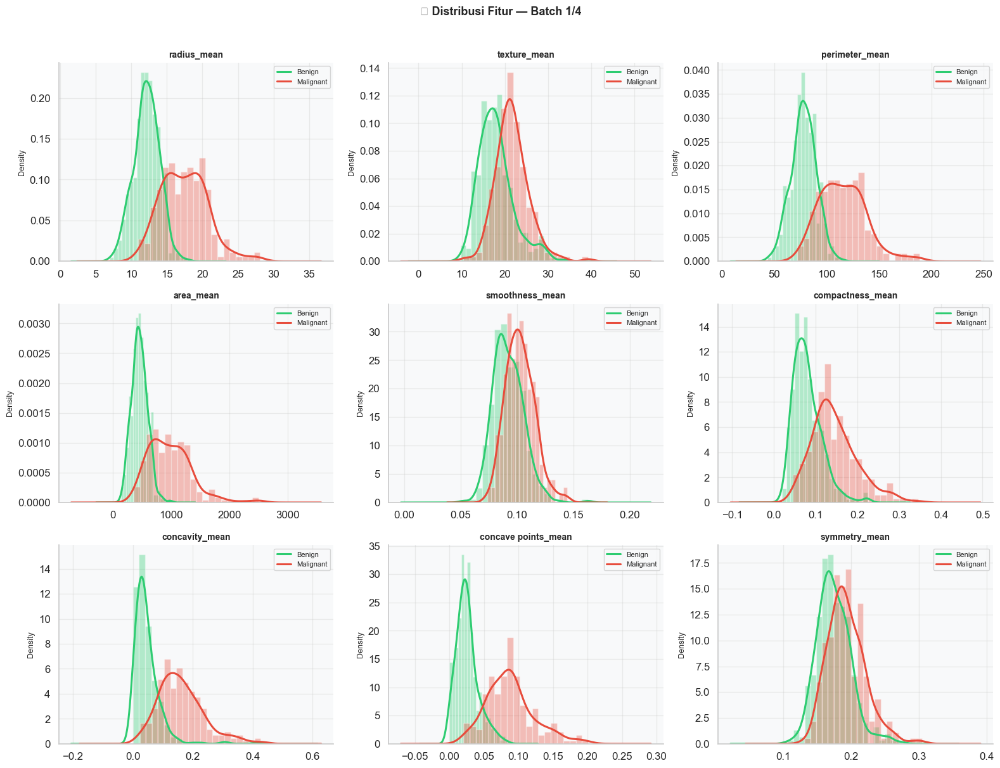

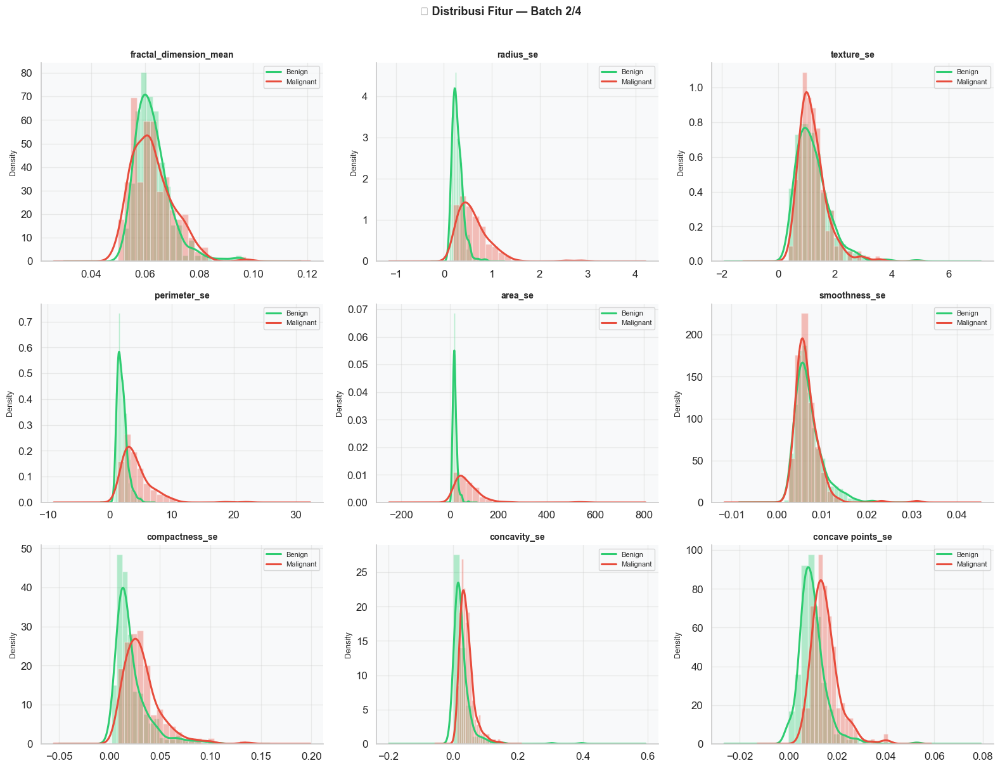

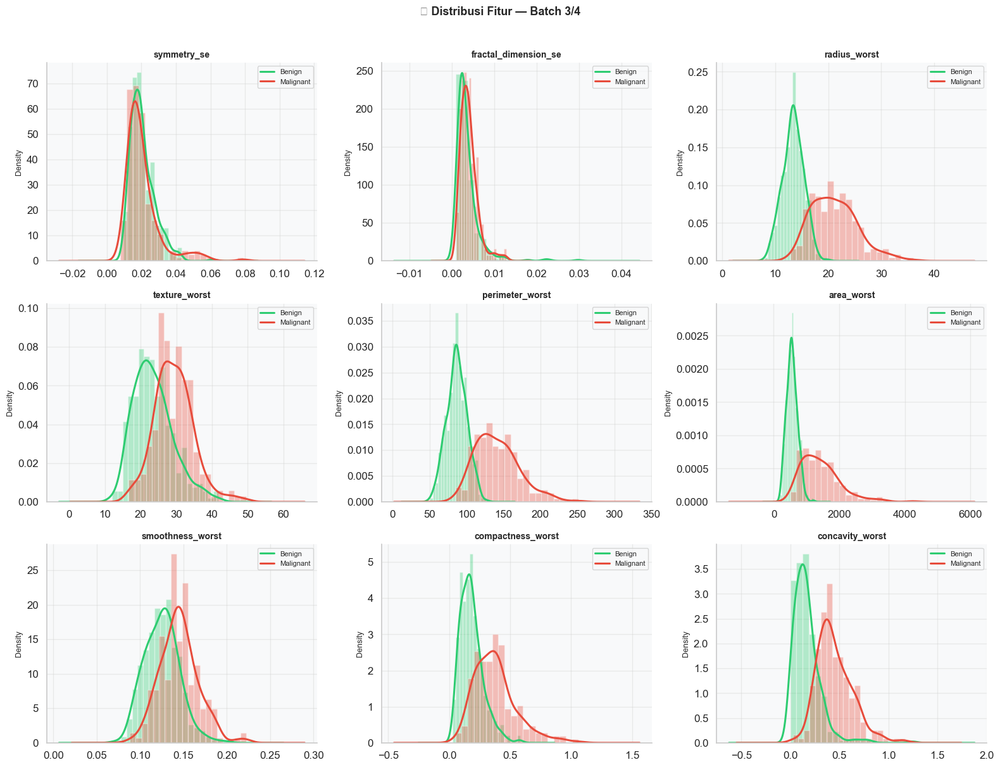

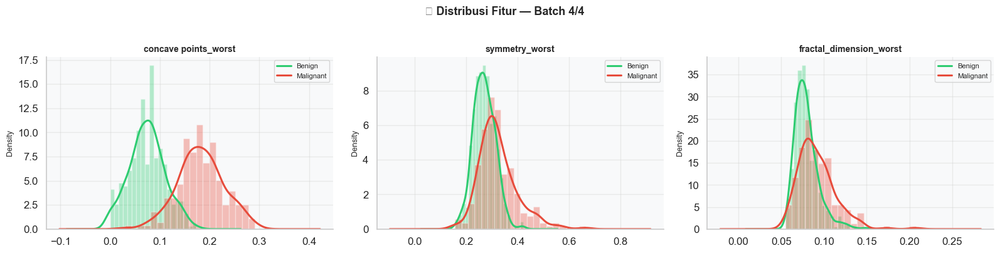

✅ Histogram selesai.


In [6]:
n_features = len(feature_cols)
batch_size = 9
n_batches  = math.ceil(n_features / batch_size)

# ── HISTOGRAM + KDE ──────────────────────────────────────
for bi in range(n_batches):
    batch = feature_cols[bi*batch_size:(bi+1)*batch_size]
    nr = math.ceil(len(batch)/3)
    fig, axes = plt.subplots(nr, 3, figsize=(16, nr*4))
    axes = np.array(axes).flatten()
    for j, feat in enumerate(batch):
        ax = axes[j]
        for cls, col in zip(['B','M'], COLORS):
            sub = df[df[TARGET_COL]==cls][feat]
            ax.hist(sub, bins=20, density=True, alpha=0.35, color=col, edgecolor='white')
            sub.plot.kde(ax=ax, color=col, linewidth=2.2,
                         label='Benign' if cls=='B' else 'Malignant')
        ax.set_title(feat, fontsize=10, fontweight='bold')
        ax.set_ylabel('Density', fontsize=9)
        ax.legend(fontsize=8)
    for k in range(len(batch), len(axes)): fig.delaxes(axes[k])
    fig.suptitle(f'📊 Distribusi Fitur — Batch {bi+1}/{n_batches}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(); plt.show(); plt.close(fig)

print('✅ Histogram selesai.')

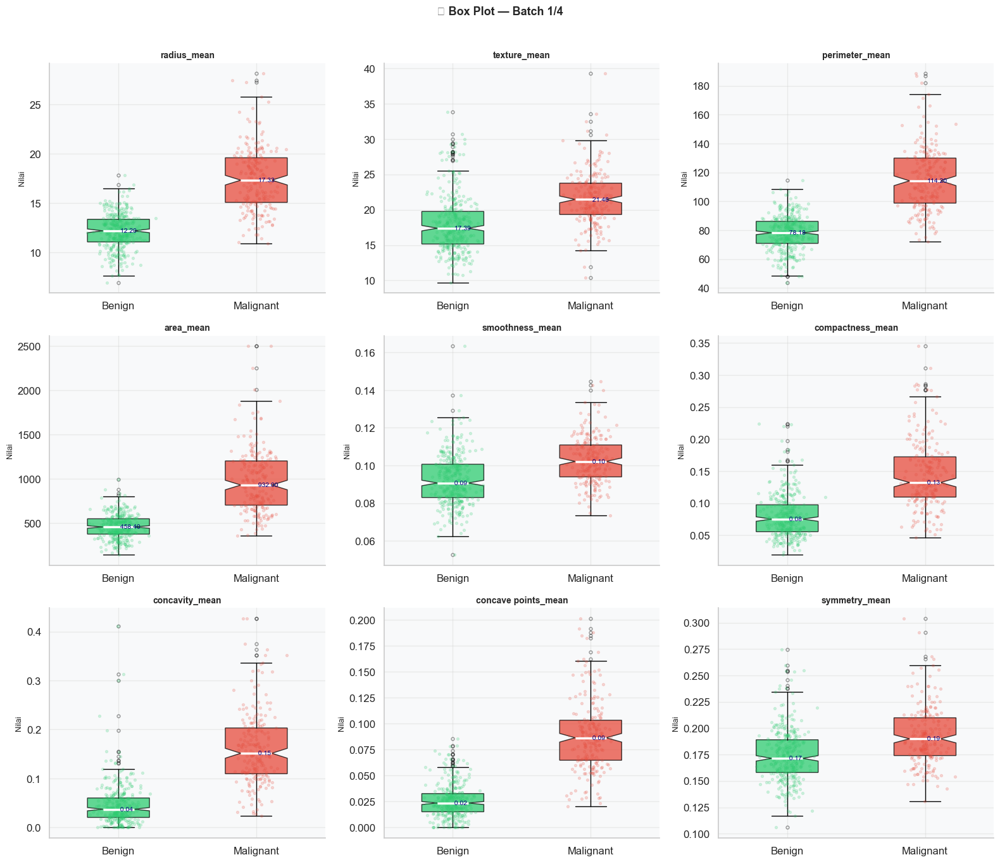

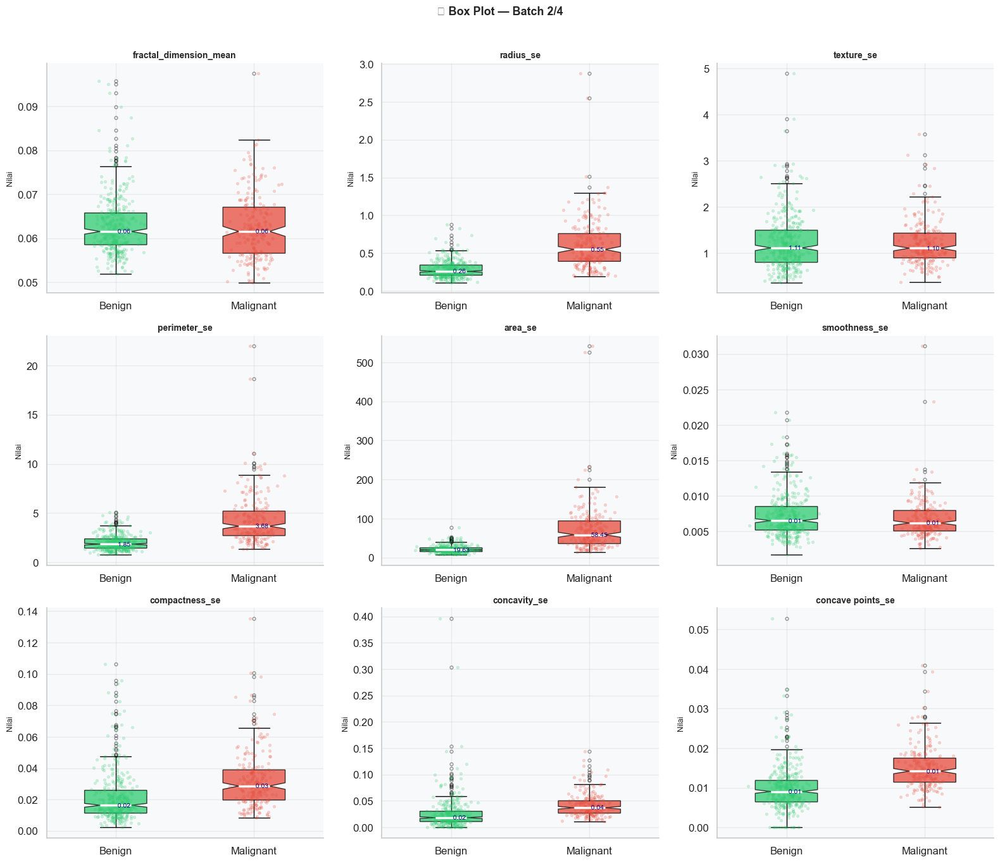

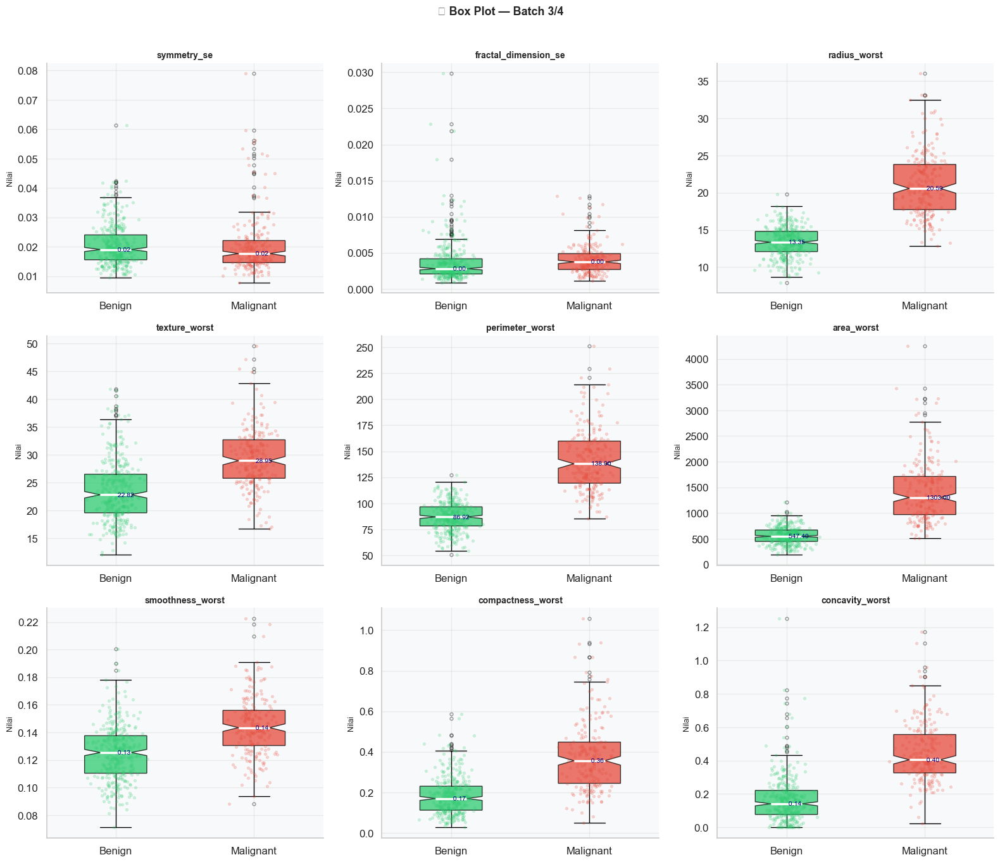

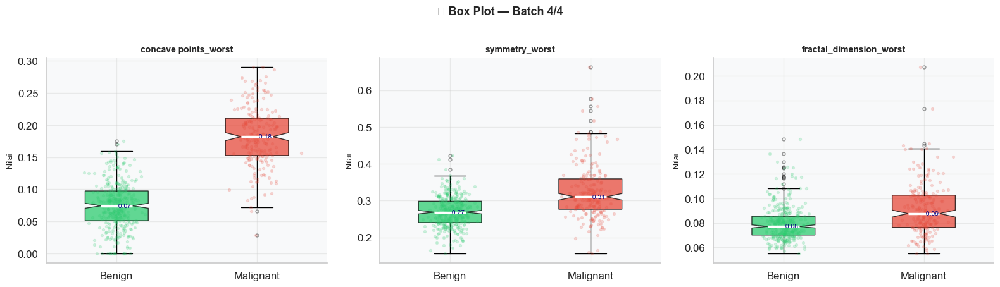

✅ Box Plot selesai.


In [7]:
# ── BOX PLOT + JITTER ─────────────────────────────────────
for bi in range(n_batches):
    batch = feature_cols[bi*batch_size:(bi+1)*batch_size]
    nr = math.ceil(len(batch)/3)
    fig, axes = plt.subplots(nr, 3, figsize=(16, nr*4.5))
    axes = np.array(axes).flatten()
    for j, feat in enumerate(batch):
        ax = axes[j]
        dB = df[df[TARGET_COL]=='B'][feat]
        dM = df[df[TARGET_COL]=='M'][feat]
        bp = ax.boxplot([dB, dM], labels=['Benign','Malignant'],
                        patch_artist=True, notch=True, widths=0.45,
                        medianprops=dict(color='white', linewidth=2.5),
                        flierprops=dict(marker='o', markersize=3.5, alpha=0.4))
        for patch, c in zip(bp['boxes'], COLORS):
            patch.set_facecolor(c); patch.set_alpha(0.75)
        for xi, (sub, c) in enumerate([(dB, COLORS[0]), (dM, COLORS[1])], 1):
            jitter = np.random.normal(xi, 0.07, size=len(sub))
            ax.scatter(jitter, sub, alpha=0.18, s=8, color=c, zorder=2)
            ax.text(xi, sub.median(), f' {sub.median():.2f}',
                    ha='left', va='center', fontsize=7.5, color='navy')
        ax.set_title(feat, fontsize=10, fontweight='bold')
        ax.set_ylabel('Nilai', fontsize=9)
    for k in range(len(batch), len(axes)): fig.delaxes(axes[k])
    fig.suptitle(f'📦 Box Plot — Batch {bi+1}/{n_batches}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(); plt.show(); plt.close(fig)

print('✅ Box Plot selesai.')

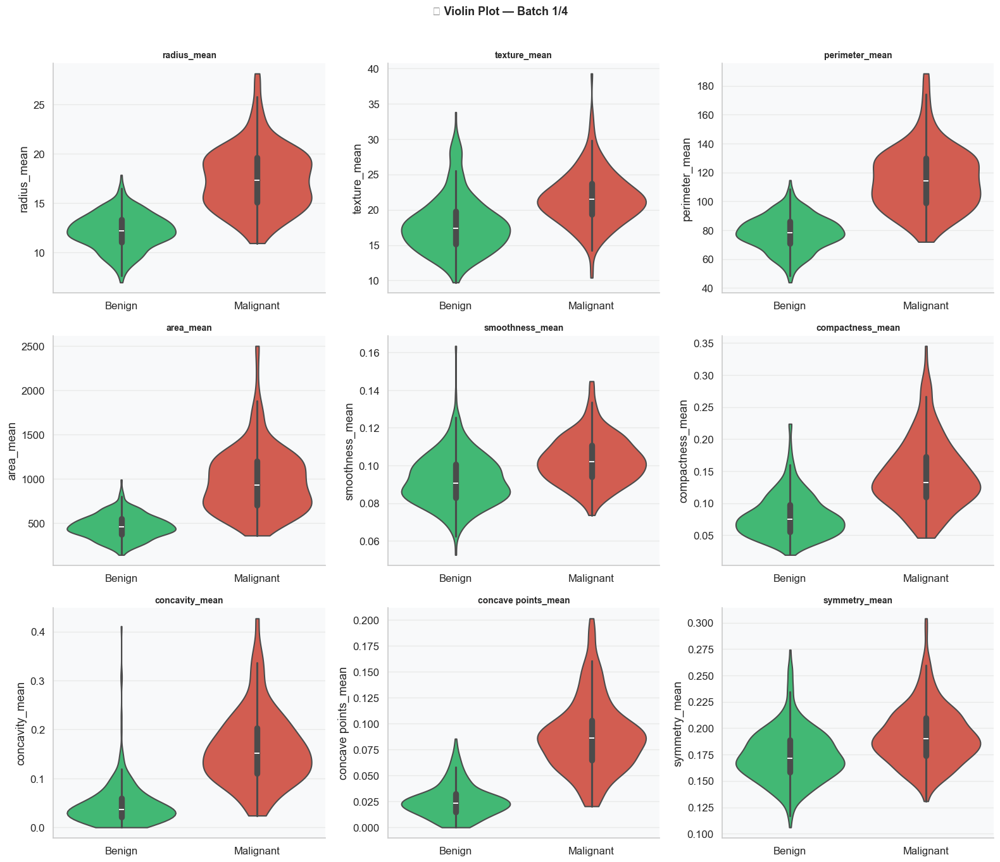

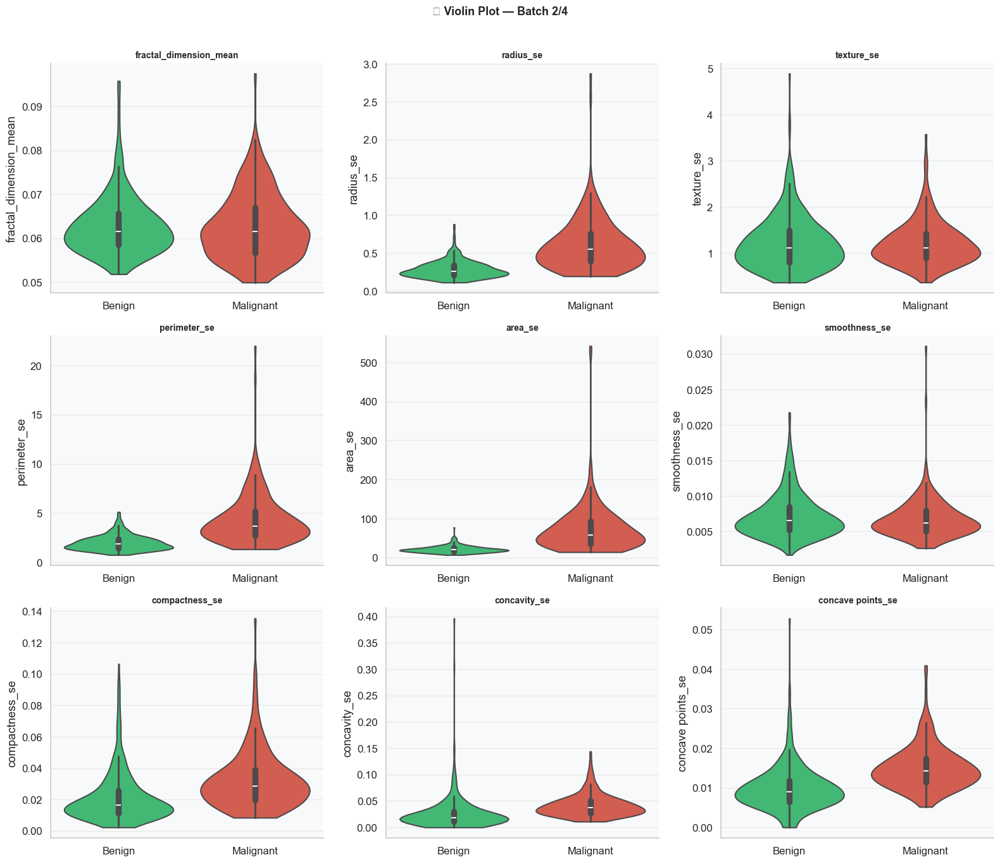

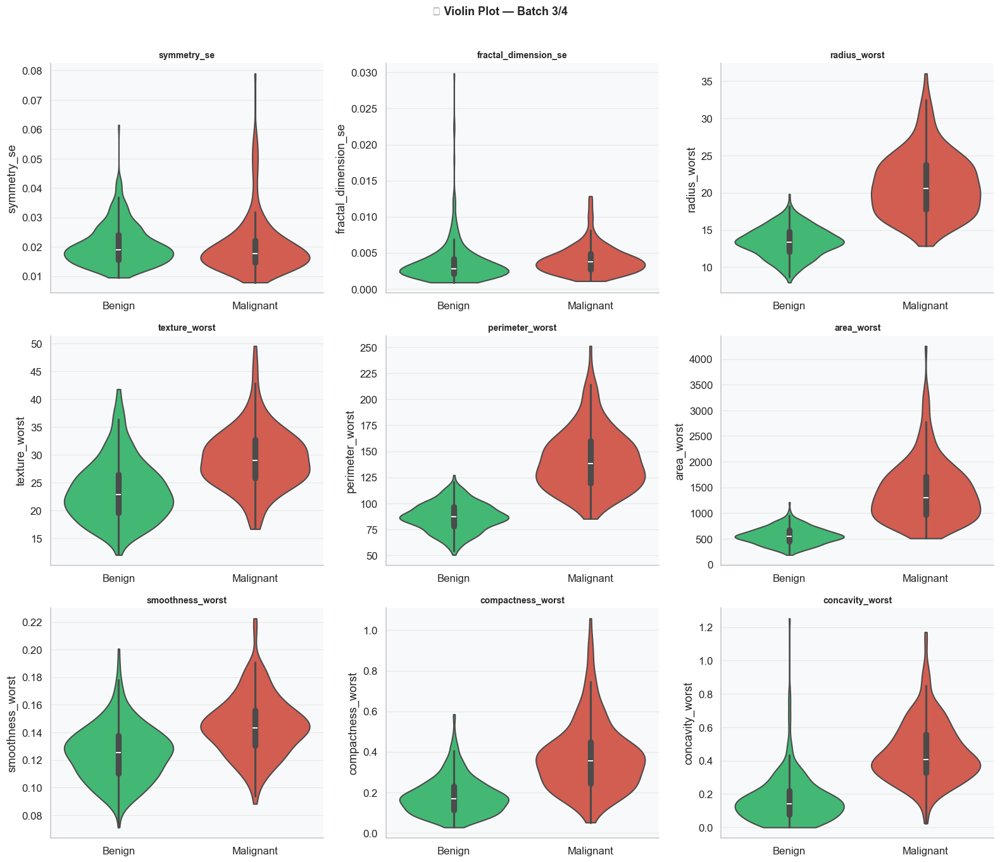

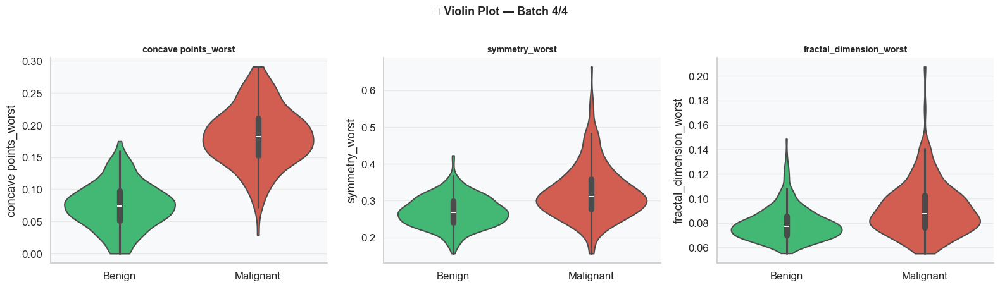

✅ Violin Plot selesai.


In [8]:
# ── VIOLIN PLOT ───────────────────────────────────────────
for bi in range(n_batches):
    batch = feature_cols[bi*batch_size:(bi+1)*batch_size]
    nr = math.ceil(len(batch)/3)
    fig, axes = plt.subplots(nr, 3, figsize=(16, nr*4.5))
    axes = np.array(axes).flatten()
    for j, feat in enumerate(batch):
        sns.violinplot(data=df[[TARGET_COL,feat]], x=TARGET_COL, y=feat,
                       palette={'B':COLORS[0],'M':COLORS[1]},
                       inner='box', cut=0, linewidth=1.5, ax=axes[j],
                       order=['B','M'])
        axes[j].set_xticklabels(['Benign','Malignant'])
        axes[j].set_title(feat, fontsize=10, fontweight='bold')
        axes[j].set_xlabel('')
    for k in range(len(batch), len(axes)): fig.delaxes(axes[k])
    fig.suptitle(f'🎻 Violin Plot — Batch {bi+1}/{n_batches}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(); plt.show(); plt.close(fig)

print('✅ Violin Plot selesai.')

## 🚨 SECTION 7: Deteksi Outlier (IQR)

,Feature,N_Outlier,Pct (%)
13,area_se,65,11.420000
10,radius_se,38,6.680000
12,perimeter_se,38,6.680000
23,area_worst,35,6.150000
14,smoothness_se,30,5.270000
19,fractal_dimension_se,28,4.920000
15,compactness_se,28,4.920000
18,symmetry_se,27,4.750000
3,area_mean,25,4.390000
29,fractal_dimension_worst,24,4.220000


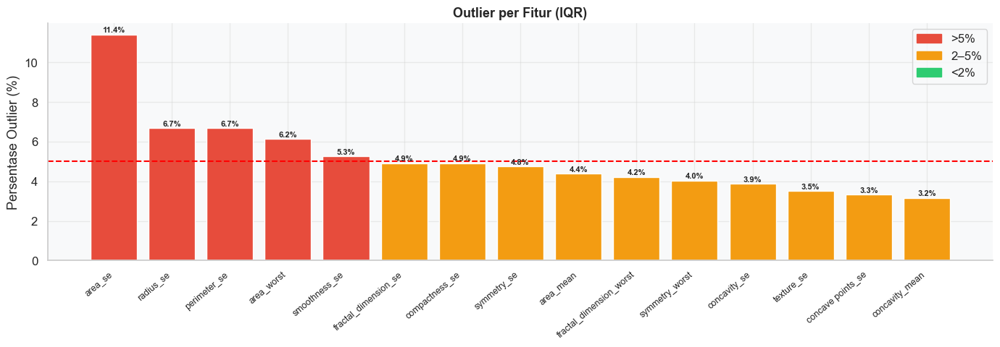

In [9]:
outlier_rows = []
for feat in feature_cols:
    Q1, Q3 = df[feat].quantile(0.25), df[feat].quantile(0.75)
    IQR = Q3 - Q1
    n_out = ((df[feat] < Q1-1.5*IQR) | (df[feat] > Q3+1.5*IQR)).sum()
    outlier_rows.append({'Feature':feat, 'N_Outlier':n_out,
                          'Pct (%)': round(n_out/len(df)*100,2)})

out_df = pd.DataFrame(outlier_rows).sort_values('N_Outlier', ascending=False)
display(out_df.head(12).style.background_gradient(cmap='Reds', subset=['N_Outlier','Pct (%)']))

top = out_df.head(15)
fig, ax = plt.subplots(figsize=(14,5))
cols = ['#e74c3c' if p>5 else '#f39c12' if p>2 else '#2ecc71' for p in top['Pct (%)']]
bars = ax.bar(top['Feature'], top['Pct (%)'], color=cols, edgecolor='white')
for bar, v in zip(bars, top['Pct (%)']):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.1,
            f'{v:.1f}%', ha='center', fontsize=8, fontweight='bold')
ax.axhline(5, color='red', linestyle='--', linewidth=1.5, label='Threshold 5%')
ax.set_xticklabels(top['Feature'], rotation=40, ha='right', fontsize=9)
ax.set_title('Outlier per Fitur (IQR)', fontsize=13, fontweight='bold')
ax.set_ylabel('Persentase Outlier (%)')
legend_patches = [mpatches.Patch(color='#e74c3c',label='>5%'),
                   mpatches.Patch(color='#f39c12',label='2–5%'),
                   mpatches.Patch(color='#2ecc71',label='<2%')]
ax.legend(handles=legend_patches, loc='upper right')
plt.tight_layout(); plt.show()

## 🌡️ SECTION 8–9: Korelasi Pearson & Eliminasi Multikolinearitas

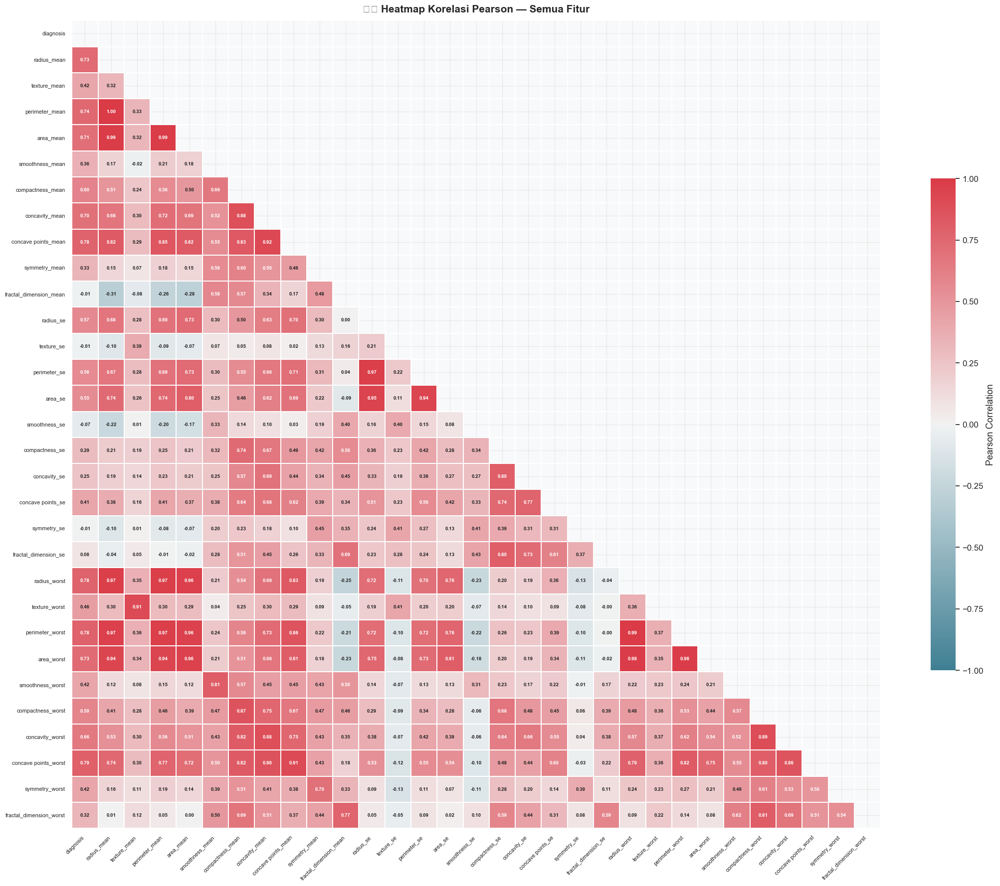

In [10]:
le = LabelEncoder()
df_enc = df.copy()
df_enc[TARGET_COL] = le.fit_transform(df[TARGET_COL])   # B=0, M=1

corr_all = df_enc.corr(method='pearson')
abs_corr  = corr_all.abs()

mask = np.zeros_like(abs_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(22, 18))
sns.heatmap(corr_all, mask=mask, cmap=sns.diverging_palette(220,10,as_cmap=True),
            vmin=-1, vmax=1, center=0, square=True, annot=True, fmt='.2f',
            annot_kws={'size':7,'weight':'bold'}, linewidths=0.3, linecolor='white',
            cbar_kws={'label':'Pearson Correlation','shrink':0.6}, ax=ax)
ax.set_title('🌡️ Heatmap Korelasi Pearson — Semua Fitur',
             fontsize=15, fontweight='bold', pad=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=8)
plt.tight_layout(); plt.show()

🏆 RANKING KORELASI TERHADAP DIAGNOSIS (absolut):
--------------------------------------------------
   1. concave points_worst           0.7936  🔴 Kuat
   2. perimeter_worst                0.7829  🔴 Kuat
   3. concave points_mean            0.7766  🔴 Kuat
   4. radius_worst                   0.7765  🔴 Kuat
   5. perimeter_mean                 0.7426  🔴 Kuat
   6. area_worst                     0.7338  🔴 Kuat
   7. radius_mean                    0.7300  🔴 Kuat
   8. area_mean                      0.7090  🔴 Kuat
   9. concavity_mean                 0.6964  🟡 Sedang
  10. concavity_worst                0.6596  🟡 Sedang
  11. compactness_mean               0.5965  🟡 Sedang
  12. compactness_worst              0.5910  🟡 Sedang
  13. radius_se                      0.5671  🟡 Sedang
  14. perimeter_se                   0.5561  🟡 Sedang
  15. area_se                        0.5482  🟡 Sedang
  16. texture_worst                  0.4569  🟡 Sedang
  17. smoothness_worst               0.4215  🟡 Sedan

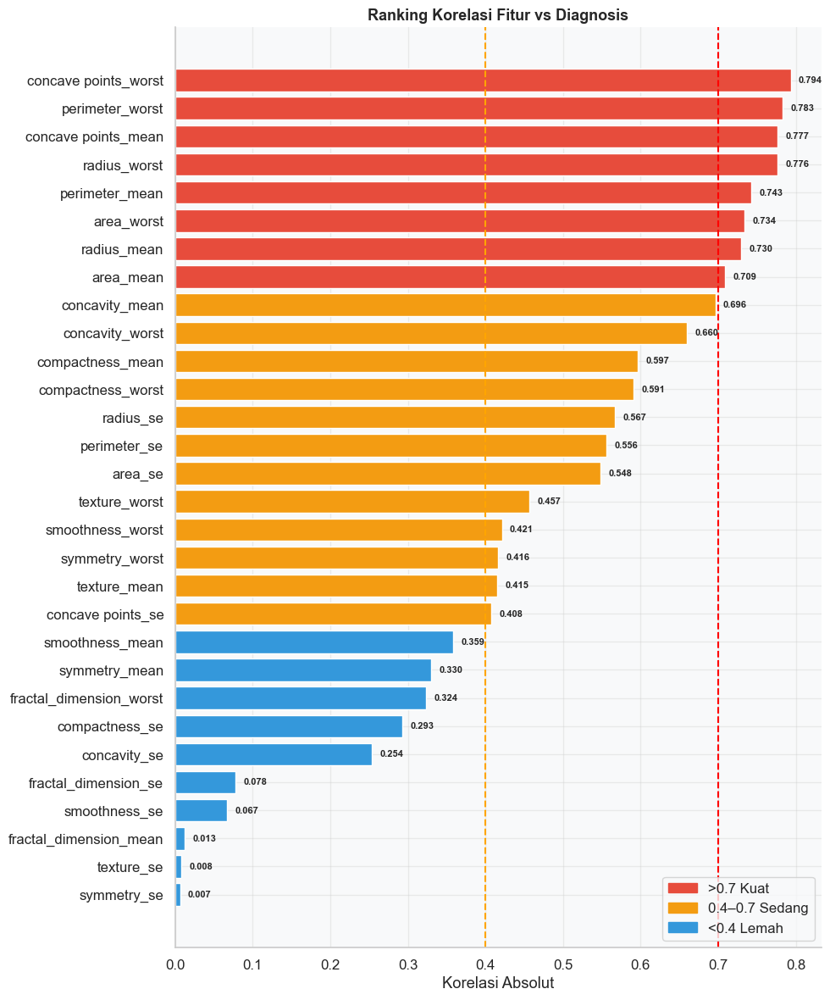

In [11]:
# ════════════════════════════════════════════════════════════
#  RANKING KORELASI TERHADAP TARGET
# ════════════════════════════════════════════════════════════
target_corr_series = abs_corr[TARGET_COL].drop(TARGET_COL).sort_values(ascending=False)

print('🏆 RANKING KORELASI TERHADAP DIAGNOSIS (absolut):')
print('-' * 50)
for i, (feat, val) in enumerate(target_corr_series.items(), 1):
    strength = '🔴 Kuat' if val > 0.7 else '🟡 Sedang' if val > 0.4 else '🔵 Lemah'
    print(f'  {i:2d}. {feat:<30} {val:.4f}  {strength}')

fig, ax = plt.subplots(figsize=(10, 12))
colors_rank = ['#e74c3c' if v>0.7 else '#f39c12' if v>0.4 else '#3498db'
               for v in target_corr_series]
ax.barh(target_corr_series.index[::-1], target_corr_series.values[::-1],
        color=colors_rank[::-1], edgecolor='white')
ax.axvline(0.4, color='orange', linestyle='--', linewidth=1.5)
ax.axvline(0.7, color='red', linestyle='--', linewidth=1.5)
ax.set_title('Ranking Korelasi Fitur vs Diagnosis', fontsize=13, fontweight='bold')
ax.set_xlabel('Korelasi Absolut')
for i, (feat, val) in enumerate(zip(target_corr_series.index[::-1],
                                     target_corr_series.values[::-1])):
    ax.text(val+0.01, i, f'{val:.3f}', va='center', fontsize=8, fontweight='bold')
patches = [mpatches.Patch(color='#e74c3c',label='>0.7 Kuat'),
            mpatches.Patch(color='#f39c12',label='0.4–0.7 Sedang'),
            mpatches.Patch(color='#3498db',label='<0.4 Lemah')]
ax.legend(handles=patches, loc='lower right')
plt.tight_layout(); plt.show()

In [12]:
# ════════════════════════════════════════════════════════════
#  ⚠️ CATATAN PENTING — Strategi Feature Selection
# ════════════════════════════════════════════════════════════
#
#  Eliminasi multikolinearitas  → LAKUKAN (buang fitur REDUNDAN)
#  Drop fitur lemah (cor < 0.4) → JANGAN (biarkan regularisasi model)
#
#  Alasan:
#  • Fitur dengan korelasi linear lemah bisa tetap memiliki kekuatan
#    prediktif non-linear (ditangkap RF, XGBoost, ANN)
#  • Regularisasi model (L1/L2, Dropout, max_depth) lebih fleksibel
#    dari hard-thresholding berbasis Pearson
#  • Lasso pre-selection bisa digunakan sebagai opsi eksplisit
#
# ════════════════════════════════════════════════════════════

MULTICOL_THRESHOLD = 0.85   # hanya untuk redundansi antar-fitur
sorted_feats = target_corr_series.index.tolist()
feats_to_drop = set()

print(f'🧹 ELIMINASI MULTIKOLINEARITAS (threshold = {MULTICOL_THRESHOLD})')
print('   (Fitur lemah TIDAK di-drop — hanya fitur REDUNDAN)')
print('-' * 60)

for i in range(len(sorted_feats)):
    f1 = sorted_feats[i]
    if f1 in feats_to_drop: continue
    for j in range(i+1, len(sorted_feats)):
        f2 = sorted_feats[j]
        if f2 in feats_to_drop: continue
        cv = abs(corr_all.loc[f1, f2])
        if cv > MULTICOL_THRESHOLD:
            feats_to_drop.add(f2)
            print(f'  ❌ Buang "{f2}" (cor={cv:.2f} dengan "{f1}")')

# Fitur terpilih: SEMUA fitur yang tidak redundan (termasuk yang korelasinya lemah)
selected_features = [f for f in sorted_feats if f not in feats_to_drop]

print('\n' + '='*60)
print(f'  Fitur awal     : {len(sorted_feats)}')
print(f'  Fitur dibuang  : {len(feats_to_drop)} (redundan/multikolinear)')
print(f'  Fitur TERPILIH : {len(selected_features)}')
print('='*60)
print('\n💎 Fitur Terpilih (termasuk yang korelasinya lemah):')
for r, f in enumerate(selected_features, 1):
    strength = '🔴' if target_corr_series[f]>0.7 else '🟡' if target_corr_series[f]>0.4 else '🔵'
    print(f'  {r:2d}. {f:<32} {target_corr_series[f]:.4f}  {strength}')

🧹 ELIMINASI MULTIKOLINEARITAS (threshold = 0.85)
   (Fitur lemah TIDAK di-drop — hanya fitur REDUNDAN)
------------------------------------------------------------
  ❌ Buang "concave points_mean" (cor=0.91 dengan "concave points_worst")
  ❌ Buang "concavity_mean" (cor=0.86 dengan "concave points_worst")
  ❌ Buang "concavity_worst" (cor=0.86 dengan "concave points_worst")
  ❌ Buang "radius_worst" (cor=0.99 dengan "perimeter_worst")
  ❌ Buang "perimeter_mean" (cor=0.97 dengan "perimeter_worst")
  ❌ Buang "area_worst" (cor=0.98 dengan "perimeter_worst")
  ❌ Buang "radius_mean" (cor=0.97 dengan "perimeter_worst")
  ❌ Buang "area_mean" (cor=0.96 dengan "perimeter_worst")
  ❌ Buang "compactness_worst" (cor=0.87 dengan "compactness_mean")
  ❌ Buang "perimeter_se" (cor=0.97 dengan "radius_se")
  ❌ Buang "area_se" (cor=0.95 dengan "radius_se")
  ❌ Buang "texture_mean" (cor=0.91 dengan "texture_worst")

  Fitur awal     : 30
  Fitur dibuang  : 12 (redundan/multikolinear)
  Fitur TERPILIH : 18

💎

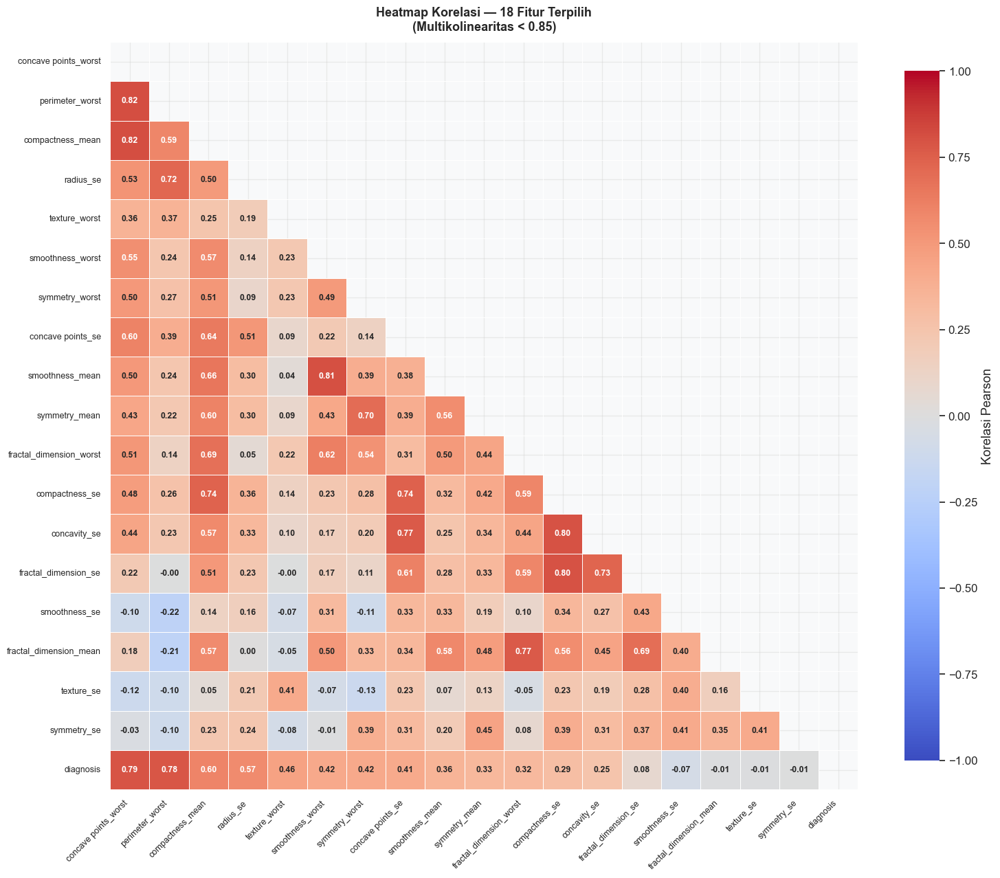

In [13]:
# Heatmap fitur terpilih
df_sel_enc = df_enc[selected_features + [TARGET_COL]]
corr_sel   = df_sel_enc.corr(method='pearson')
mask_sel   = np.zeros_like(corr_sel, dtype=bool)
mask_sel[np.triu_indices_from(mask_sel)] = True

fig, ax = plt.subplots(figsize=(max(10, len(selected_features)*0.75+2),
                                max(8,  len(selected_features)*0.65+2)))
sns.heatmap(corr_sel, mask=mask_sel, cmap='coolwarm',
            vmin=-1, vmax=1, center=0, square=True,
            annot=True, fmt='.2f', annot_kws={'size':9,'weight':'bold'},
            linewidths=0.5, linecolor='white',
            cbar_kws={'label':'Korelasi Pearson','shrink':0.8}, ax=ax)
ax.set_title(f'Heatmap Korelasi — {len(selected_features)} Fitur Terpilih\n(Multikolinearitas < {MULTICOL_THRESHOLD})',
             fontsize=13, fontweight='bold', pad=12)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=9)
plt.tight_layout(); plt.show()

## 🔬 SECTION 10: ANOVA F-Test vs Mutual Information

,Feature,ANOVA_F,p_value,MI_Score
0,perimeter_worst,897.94,0.0000,0.4756
1,concave points_worst,964.39,0.0000,0.4350
2,radius_se,268.84,0.0000,0.2461
3,compactness_mean,313.23,0.0000,0.2137
4,concave points_se,113.26,0.0000,0.1276
5,texture_worst,149.60,0.0000,0.1201
6,concavity_se,39.01,0.0000,0.1187
7,smoothness_worst,122.47,0.0000,0.1017
8,symmetry_worst,118.86,0.0000,0.0973
9,smoothness_mean,83.65,0.0000,0.0827


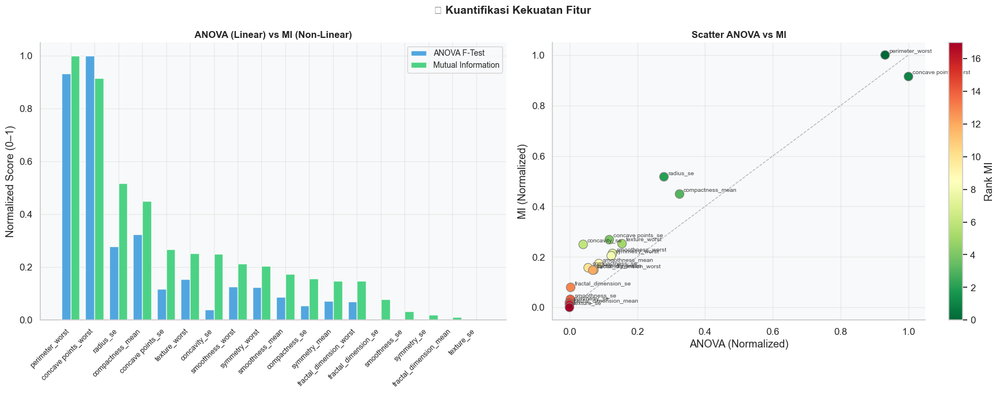

In [ ]:
X_mi = df_enc[selected_features]
y_mi = df_enc[TARGET_COL]

f_vals, p_vals = f_classif(X_mi, y_mi)
mi_vals        = mutual_info_classif(X_mi, y_mi, random_state=SEED)

score_df = pd.DataFrame({
    'Feature': selected_features,
    'ANOVA_F': f_vals, 'p_value': p_vals, 'MI_Score': mi_vals
})
mm = MinMaxScaler()
score_df[['ANOVA_norm','MI_norm']] = mm.fit_transform(score_df[['ANOVA_F','MI_Score']])
score_df = score_df.sort_values('MI_Score', ascending=False).reset_index(drop=True)

display(score_df[['Feature','ANOVA_F','p_value','MI_Score']].style
    .background_gradient(cmap='Greens', subset=['MI_Score'])
    .background_gradient(cmap='Blues',  subset=['ANOVA_F'])
    .format({'ANOVA_F':'{:.2f}','p_value':'{:.7f}','MI_Score':'{:.4f}'})
)

x_pos = np.arange(len(score_df))
w = 0.38
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

ax = axes[0]
ax.bar(x_pos-w/2, score_df['ANOVA_norm'], w, label='ANOVA F-Test', color='#3498db', alpha=0.85, edgecolor='white')
ax.bar(x_pos+w/2, score_df['MI_norm'], w, label='Mutual Information', color='#2ecc71', alpha=0.85, edgecolor='white')
ax.set_xticks(x_pos)
ax.set_xticklabels(score_df['Feature'], rotation=45, ha='right', fontsize=9)
ax.set_ylabel('Normalized Score (0–1)')
ax.set_title('ANOVA (Linear) vs MI (Non-Linear)', fontsize=12, fontweight='bold')
ax.legend(fontsize=10)

ax2 = axes[1]
sc = ax2.scatter(score_df['ANOVA_norm'], score_df['MI_norm'],
                  c=np.arange(len(score_df)), cmap='RdYlGn_r', s=120,
                  edgecolors='gray', linewidths=0.8)
for _, row in score_df.iterrows():
    ax2.annotate(row['Feature'], (row['ANOVA_norm'], row['MI_norm']),
                 xytext=(5,3), textcoords='offset points', fontsize=7.5, alpha=0.85)
ax2.plot([0,1],[0,1],'k--',alpha=0.3,linewidth=1)
ax2.set_xlabel('ANOVA (Normalized)'); ax2.set_ylabel('MI (Normalized)')
ax2.set_title('Scatter ANOVA vs MI', fontsize=12, fontweight='bold')
plt.colorbar(sc, ax=ax2, label='Rank MI')

fig.suptitle('🔬 Kuantifikasi Kekuatan Fitur', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

## ⚗️ SECTION 11: Transformasi Box-Cox

> **Mengapa Box-Cox (bukan Yeo-Johnson)?**
>
> | Kriteria | Box-Cox | Yeo-Johnson |
> |---|---|---|
> | Data harus positif | ✅ Ya (ditangani dengan epsilon shift) | ❌ Tidak perlu |
> | Right-skewed data | ✅ Sangat efektif | ✅ Efektif |
> | Outlier tinggi | ✅ Lebih agresif menekan | ✅ Efektif |
> | Range bervariasi | ✅ λ optimal per fitur | ✅ λ optimal per fitur |
> | **Cocok untuk dataset ini** | ✅ **Lebih baik** — data positif, right-skewed | ⚠️ Aman tapi kurang optimal |
>
> **Solusi untuk nilai = 0:** tambahkan `epsilon = 1e-6` sebelum transform

In [15]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox

print('⏳ Transformasi Box-Cox pada fitur terpilih...')
print('   (Otomatis menambah epsilon shift jika ada nilai ≤ 0)')
print()

X_raw = df[selected_features].copy()
y_label = df[TARGET_COL].copy()

X_boxcox = pd.DataFrame(index=X_raw.index)
lambda_dict = {}   # simpan lambda untuk inverse transform jika perlu
epsilon_dict = {}  # simpan epsilon shift per fitur

skew_rows = []
for feat in selected_features:
    col_data = X_raw[feat].copy()
    min_val = col_data.min()

    # Auto epsilon shift jika ada nilai <= 0
    eps = 0.0
    if min_val <= 0:
        eps = abs(min_val) + 1e-6
        col_data = col_data + eps
        epsilon_dict[feat] = eps
        print(f'  ⚠️  {feat:<32} min={min_val:.6f} → +{eps:.2e} ditambahkan')
    else:
        epsilon_dict[feat] = 0.0

    # Box-Cox transform (scipy mengembalikan data transformed + lambda optimal)
    transformed, lam = boxcox(col_data)
    lambda_dict[feat] = lam
    X_boxcox[feat] = transformed

    skew_before = X_raw[feat].skew()
    skew_after  = X_boxcox[feat].skew()
    skew_rows.append({'Fitur': feat,
                       'Skew Before': round(skew_before, 4),
                       'Skew After (Box-Cox)': round(skew_after, 4),
                       'Lambda (λ)': round(lam, 4),
                       'Improvement': round(abs(skew_before)-abs(skew_after), 4)})

df_transformed = X_boxcox.copy()
df_transformed[TARGET_COL] = y_label.values

# Tabel perbandingan skewness
skew_df = pd.DataFrame(skew_rows).sort_values('Skew Before', ascending=False)
print(f'\n✅ Box-Cox selesai untuk {len(selected_features)} fitur.')
print('\n📊 Perbandingan Skewness Before vs After (Box-Cox):')
display(skew_df.style
    .background_gradient(cmap='RdYlGn', subset=['Improvement'])
    .background_gradient(cmap='Reds_r', subset=['Skew Before'])
    .background_gradient(cmap='Greens_r', subset=['Skew After (Box-Cox)'])
    .format(precision=4)
)

⏳ Transformasi Box-Cox pada fitur terpilih...
   (Otomatis menambah epsilon shift jika ada nilai ≤ 0)

  ⚠️  concave points_worst             min=0.000000 → +1.00e-06 ditambahkan
  ⚠️  concave points_se                min=0.000000 → +1.00e-06 ditambahkan
  ⚠️  concavity_se                     min=0.000000 → +1.00e-06 ditambahkan

✅ Box-Cox selesai untuk 18 fitur.

📊 Perbandingan Skewness Before vs After (Box-Cox):


,Fitur,Skew Before,Skew After (Box-Cox),Lambda (λ),Improvement
12,concavity_se,5.1105,0.1655,0.3833,4.9450
13,fractal_dimension_se,3.9240,-0.0004,-0.3081,3.9235
3,radius_se,3.0886,0.0303,-0.3976,3.0583
14,smoothness_se,2.3145,-0.0202,-0.2972,2.2943
17,symmetry_se,2.1951,0.0082,-0.6484,2.1869
11,compactness_se,1.9022,-0.0000,0.0021,1.9022
10,fractal_dimension_worst,1.6626,0.0249,-1.3446,1.6377
16,texture_se,1.6464,-0.0001,-0.0223,1.6463
7,concave points_se,1.4447,0.0335,0.5848,1.4112
6,symmetry_worst,1.4339,-0.0316,-0.4720,1.4023


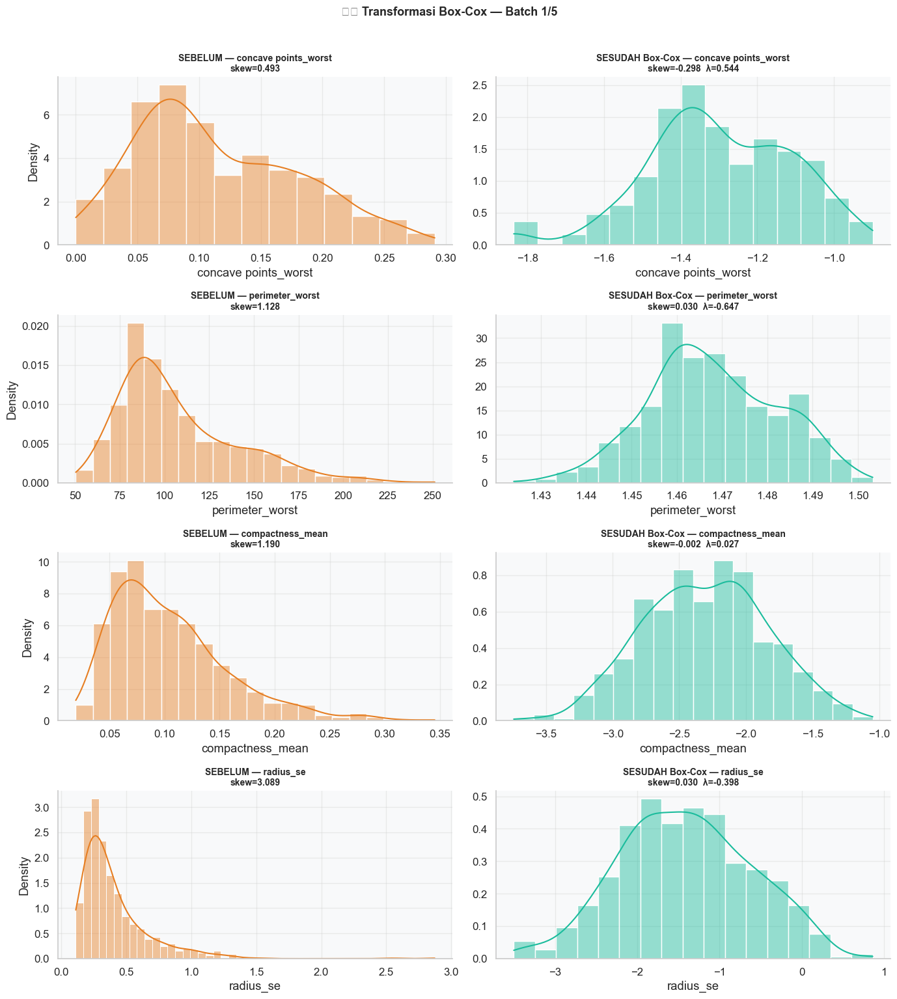

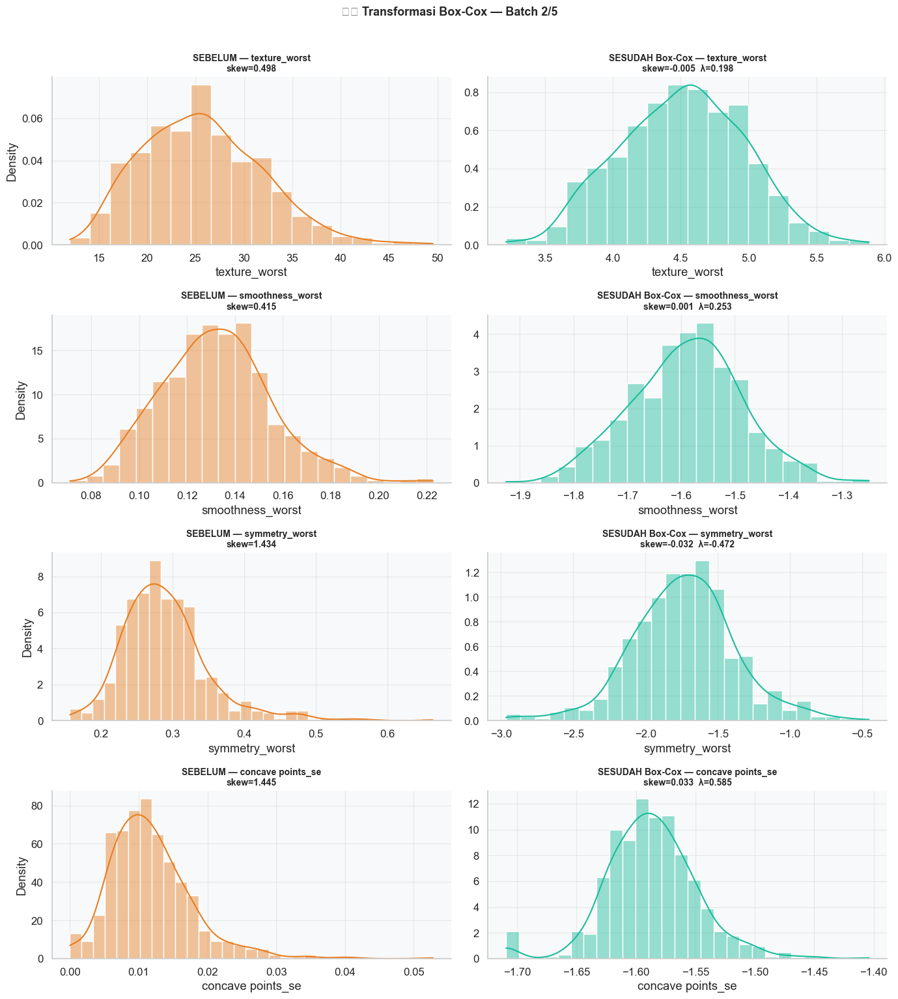

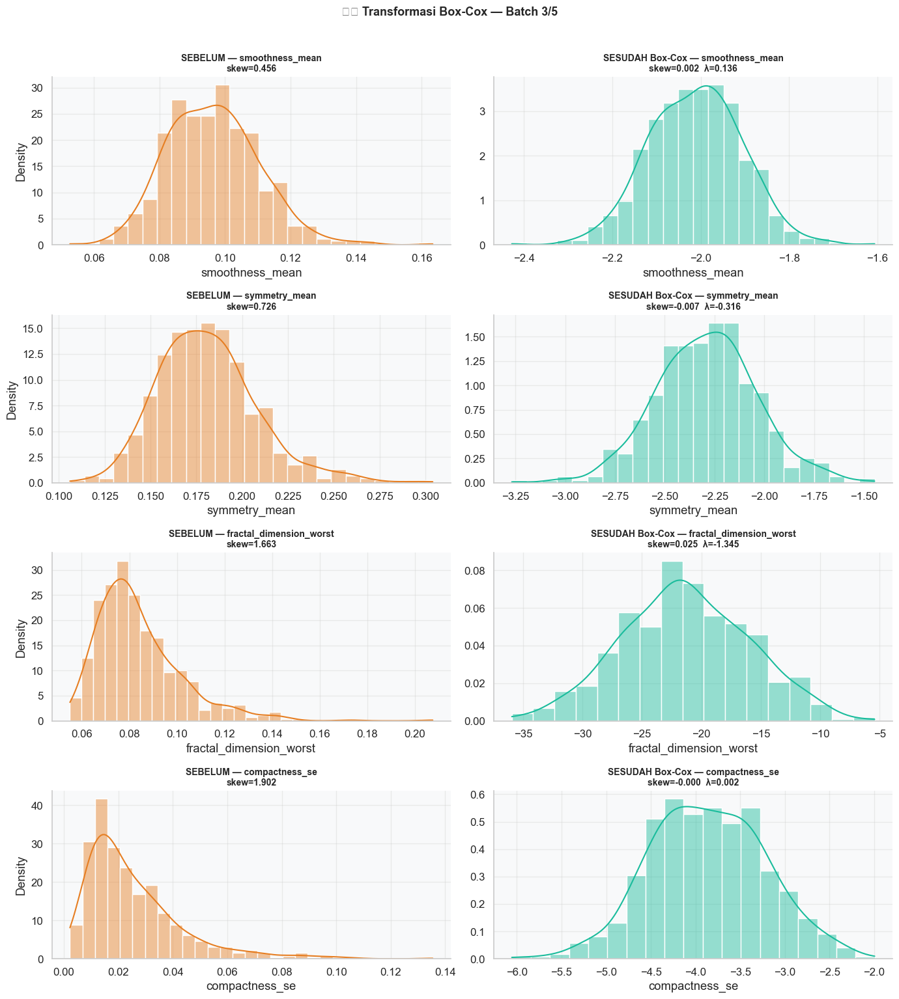

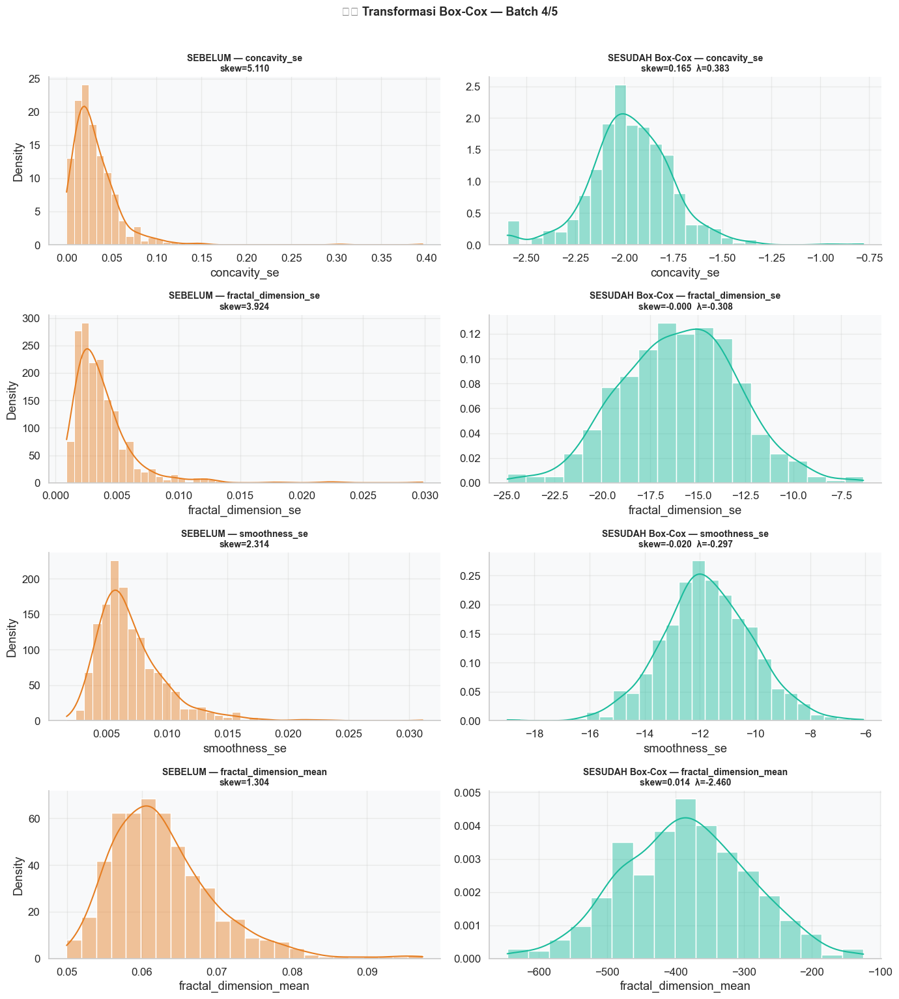

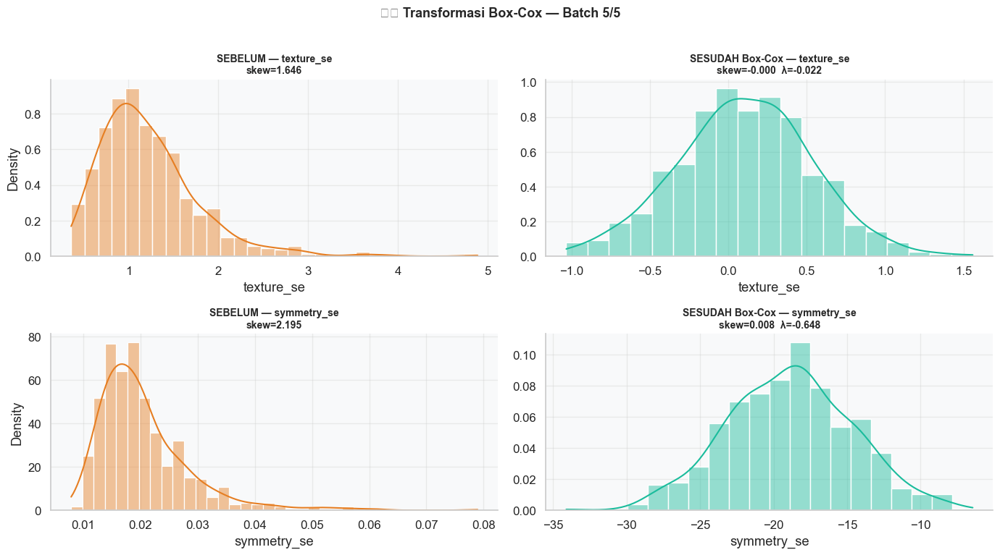

✅ Visualisasi Box-Cox selesai.


In [16]:
# Visualisasi Before vs After Box-Cox per batch
batch_size_t = 4
n_batches_t  = math.ceil(len(selected_features)/batch_size_t)

for bi in range(n_batches_t):
    batch = selected_features[bi*batch_size_t:(bi+1)*batch_size_t]
    nb = len(batch)
    fig, axes = plt.subplots(nb, 2, figsize=(14, 3.8*nb))
    if nb == 1: axes = np.array([axes])

    for j, feat in enumerate(batch):
        lam = lambda_dict[feat]
        sb  = X_raw[feat].skew()
        sa  = df_transformed[feat].skew()

        # BEFORE
        sns.histplot(X_raw[feat], kde=True, ax=axes[j,0],
                     color='#e67e22', stat='density', alpha=0.45)
        axes[j,0].set_title(f'SEBELUM — {feat}\nskew={sb:.3f}',
                              fontweight='bold', fontsize=10)
        axes[j,0].set_ylabel('Density')

        # AFTER
        sns.histplot(df_transformed[feat], kde=True, ax=axes[j,1],
                     color='#1abc9c', stat='density', alpha=0.45)
        axes[j,1].set_title(f'SESUDAH Box-Cox — {feat}\nskew={sa:.3f}  λ={lam:.3f}',
                              fontweight='bold', fontsize=10)
        axes[j,1].set_ylabel('')

    fig.suptitle(f'⚗️ Transformasi Box-Cox — Batch {bi+1}/{n_batches_t}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(); plt.show(); plt.close(fig)

print('✅ Visualisasi Box-Cox selesai.')

## 🔵 SECTION 12: PCA Visualization (2D + 3D + Scree Plot)

PC1=40.83%  PC2=15.17%  PC3=11.63%  Total=67.63%


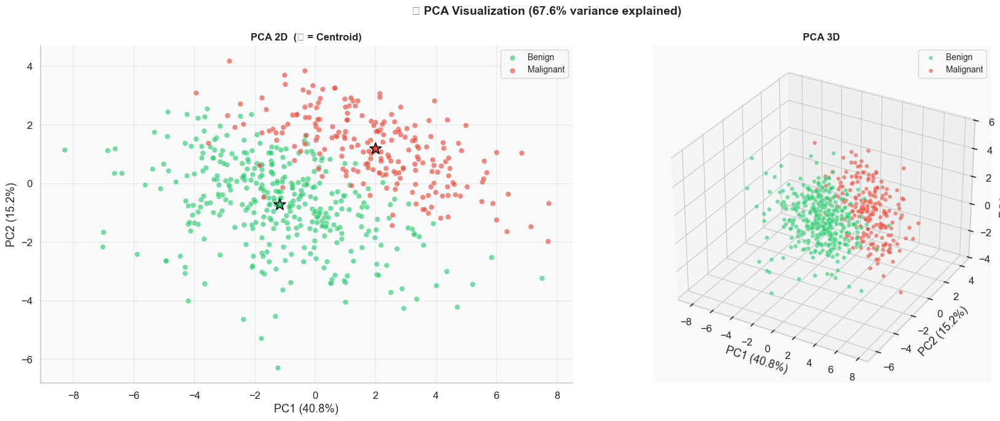

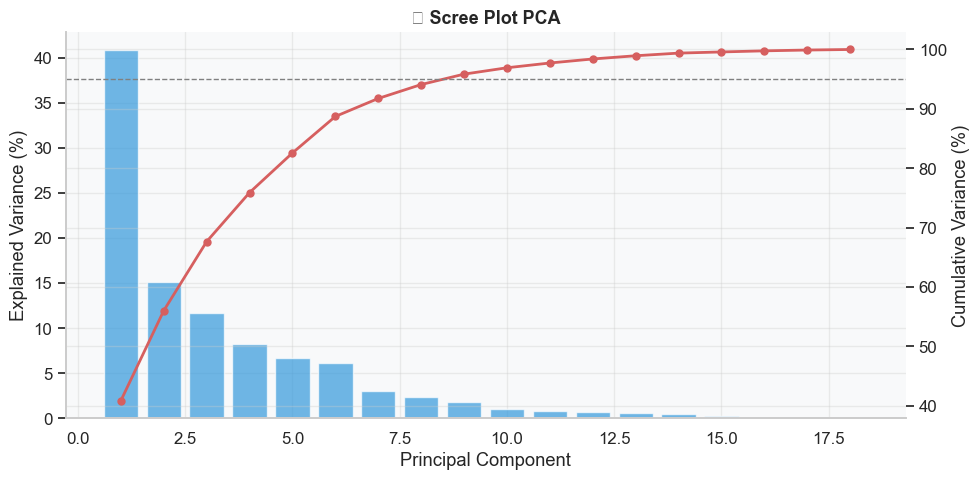

✅ PCA selesai.


In [17]:
# Standardize dulu sebelum PCA (PCA sensitif terhadap skala)
X_for_pca = StandardScaler().fit_transform(df_transformed[selected_features].values)
y_pca     = df_transformed[TARGET_COL].map({'B':0,'M':1}).values

pca3  = PCA(n_components=3, random_state=SEED)
X_p3  = pca3.fit_transform(X_for_pca)
ev    = pca3.explained_variance_ratio_ * 100
print(f'PC1={ev[0]:.2f}%  PC2={ev[1]:.2f}%  PC3={ev[2]:.2f}%  Total={sum(ev):.2f}%')

fig = plt.figure(figsize=(18, 7))
ax1 = fig.add_subplot(121)
for lv, ln, c in [(0,'Benign','#2ecc71'),(1,'Malignant','#e74c3c')]:
    m = y_pca==lv
    ax1.scatter(X_p3[m,0], X_p3[m,1], c=c, label=ln, alpha=0.65, s=40, edgecolors='white', linewidths=0.4)
    ax1.scatter(X_p3[m,0].mean(), X_p3[m,1].mean(), c=c, s=200, marker='*', zorder=5, edgecolors='black', linewidths=1.2)
ax1.set_xlabel(f'PC1 ({ev[0]:.1f}%)'); ax1.set_ylabel(f'PC2 ({ev[1]:.1f}%)')
ax1.set_title('PCA 2D  (★ = Centroid)', fontsize=12, fontweight='bold')
ax1.legend(fontsize=10)

ax2 = fig.add_subplot(122, projection='3d')
for lv, ln, c in [(0,'Benign','#2ecc71'),(1,'Malignant','#e74c3c')]:
    m = y_pca==lv
    ax2.scatter(X_p3[m,0], X_p3[m,1], X_p3[m,2], c=c, label=ln, alpha=0.6, s=25, edgecolors='white', linewidths=0.3)
ax2.set_xlabel(f'PC1 ({ev[0]:.1f}%)'); ax2.set_ylabel(f'PC2 ({ev[1]:.1f}%)'); ax2.set_zlabel(f'PC3 ({ev[2]:.1f}%)')
ax2.set_title('PCA 3D', fontsize=12, fontweight='bold'); ax2.legend(fontsize=10)

fig.suptitle(f'🔵 PCA Visualization ({sum(ev):.1f}% variance explained)',
             fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

# Scree plot
pca_f = PCA(random_state=SEED).fit(X_for_pca)
cumv  = np.cumsum(pca_f.explained_variance_ratio_*100)
fig2, ax = plt.subplots(figsize=(10,5))
ax.bar(range(1,len(pca_f.explained_variance_ratio_)+1),
       pca_f.explained_variance_ratio_*100, color='#3498db', alpha=0.7)
ax2b = ax.twinx()
ax2b.plot(range(1,len(cumv)+1), cumv, 'r-o', markersize=5, linewidth=2)
ax2b.axhline(95, color='gray', linestyle='--', linewidth=1)
ax.set_xlabel('Principal Component'); ax.set_ylabel('Explained Variance (%)')
ax2b.set_ylabel('Cumulative Variance (%)')
ax.set_title('📊 Scree Plot PCA', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print('✅ PCA selesai.')

## 🔗 SECTION 13: Pairplot Top-5 Fitur Terpilih

🔗 Menampilkan pairplot untuk 18 fitur terpilih.


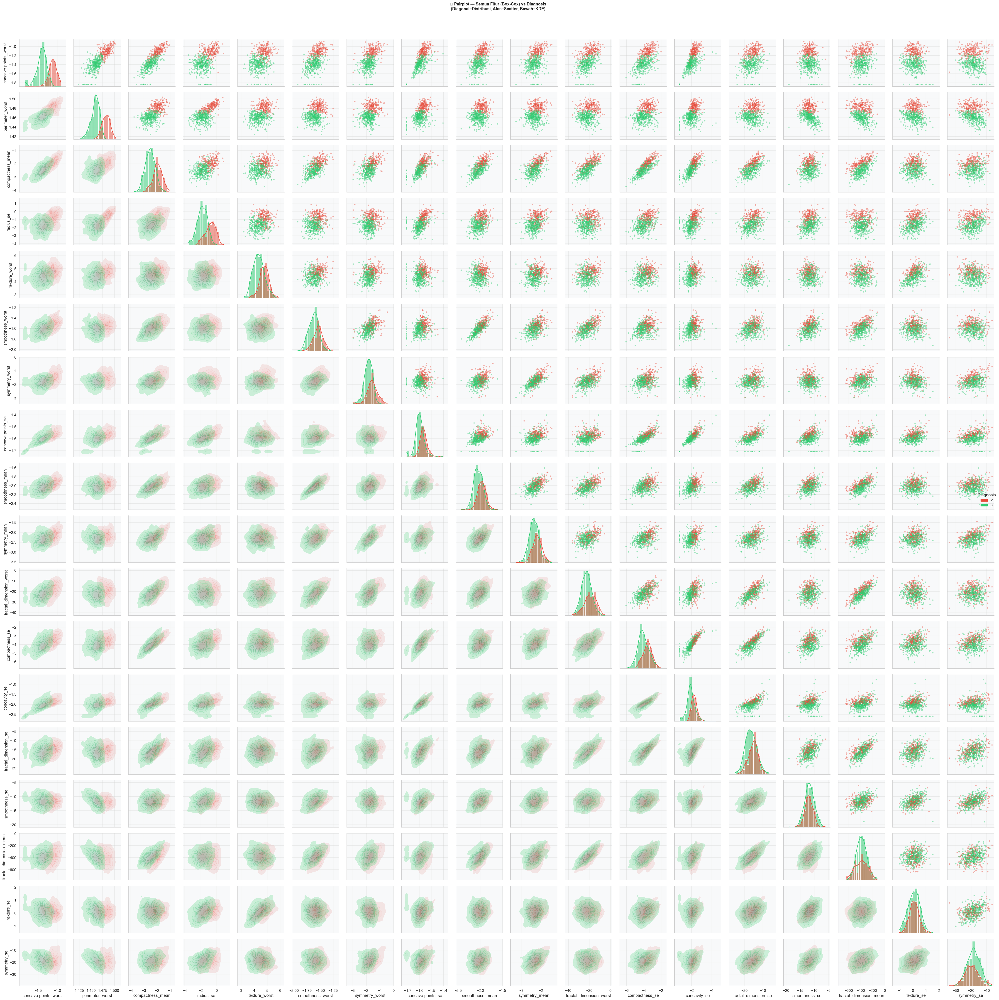

✅ Pairplot selesai.


In [30]:
# 1. Ambil DAFTAR NAMA FITUR saja (tanpa kolom target)
feats = [col for col in df_transformed.columns if col != TARGET_COL]
print(f"🔗 Menampilkan pairplot untuk {len(feats)} fitur terpilih.")

# 2. Gunakan df_transformed agar visualisasinya mencerminkan hasil Box-Cox
pair_df = df_transformed[feats + [TARGET_COL]].copy()

# 3. Proses plotting dengan PairGrid
g = sns.PairGrid(pair_df, hue=TARGET_COL, palette={'B': '#2ecc71', 'M': '#e74c3c'},
                 diag_sharey=False, height=2.4, aspect=1)

g.map_upper(sns.scatterplot, alpha=0.45, s=18, edgecolors='none')
g.map_lower(sns.kdeplot, fill=True, alpha=0.3, warn_singular=False)
g.map_diag(sns.histplot, kde=True, stat='density', alpha=0.5, bins=15)

g.add_legend(fontsize=11, title='Diagnosis', title_fontsize=11)
g.figure.suptitle('🔗 Pairplot — Semua Fitur (Box-Cox) vs Diagnosis\n'
                   '(Diagonal=Distribusi, Atas=Scatter, Bawah=KDE)',
                   fontsize=13, fontweight='bold', y=1.02)

plt.tight_layout()
plt.show()
print("✅ Pairplot selesai.")

## 🏋️ SECTION 13: Preprocessing — SMOTE & Stratified Split

> **Normalisasi yang model-aware:**
>
> | Model | Perlu Scaling? | Alasan |
> |---|---|---|
> | **SVM** | ✅ Ya (wajib) | Kernel RBF berbasis jarak Euclidean — sensitif skala |
> | **ANN** | ✅ Ya (wajib) | Gradient descent konvergen lebih cepat, menghindari saturasi |
> | **XGBoost** | ❌ Tidak perlu | Tree-based — split berdasarkan rank/threshold, bukan nilai absolut |
> | **Random Forest** | ❌ Tidak perlu | Sama seperti XGBoost — invariant terhadap monotonic transform |
>
> Pipeline yang benar: scaling dimasukkan dalam `sklearn.Pipeline` per model,
> sehingga `scaler.fit()` hanya dilakukan di training set (mencegah data leakage).

In [19]:
print('=' * 60)
print('🏋️  PREPROCESSING PIPELINE')
print('=' * 60)

# Data input: Box-Cox transformed, fitur terpilih
X_all = df_transformed[selected_features].values
y_all = df_transformed[TARGET_COL].map({'B':0,'M':1}).values.astype(int)

print(f'\n[1] Dataset: {X_all.shape}, Benign={sum(y_all==0)}, Malignant={sum(y_all==1)}')

# ── Stratified Split (manual) ─────────────────────────────
def stratified_split(X, y, test_size=0.25, rs=42):
    np.random.seed(rs)
    train_idx, test_idx = [], []
    for cls in np.unique(y):
        idx = np.where(y==cls)[0]
        np.random.shuffle(idx)
        n_t = int(len(idx)*test_size)
        test_idx.extend(idx[:n_t]); train_idx.extend(idx[n_t:])
    ti, vi = np.array(train_idx), np.array(test_idx)
    np.random.shuffle(ti); np.random.shuffle(vi)
    return X[ti], X[vi], y[ti], y[vi]

X_train_raw, X_test_raw, y_train_raw, y_test = stratified_split(X_all, y_all)
print(f'[2] Train={len(y_train_raw)}  Test={len(y_test)}')

# ── SMOTE (hanya di training set!) ───────────────────────
smote = SMOTE(random_state=SEED, k_neighbors=5)
X_train_res, y_train_res = smote.fit_resample(X_train_raw, y_train_raw)

print(f'[3] Setelah SMOTE: Benign={sum(y_train_res==0)}, Malignant={sum(y_train_res==1)}')

# ── Data Mentah (untuk RF & XGBoost — tidak perlu scaling) ─
# Gunakan X_train_res / X_test_raw langsung
X_train_tree = X_train_res    # RF & XGBoost
X_test_tree  = X_test_raw

# ── Scaled (untuk SVM & ANN) ──────────────────────────────
# fit HANYA di training, transform di test
scaler_svm_ann = StandardScaler()
X_train_sc = scaler_svm_ann.fit_transform(X_train_res)
X_test_sc  = scaler_svm_ann.transform(X_test_raw)

N_FEATURES = X_train_sc.shape[1]
print(f'[4] X_train (tree): {X_train_tree.shape} (unscaled)')
print(f'    X_train (nn/svm): {X_train_sc.shape} (StandardScaler)')
print('\n✅ Preprocessing selesai!')

🏋️  PREPROCESSING PIPELINE

[1] Dataset: (569, 18), Benign=357, Malignant=212
[2] Train=427  Test=142


[3] Setelah SMOTE: Benign=268, Malignant=268
[4] X_train (tree): (536, 18) (unscaled)
    X_train (nn/svm): (536, 18) (StandardScaler)

✅ Preprocessing selesai!


## ⚡ SECTION 14–17: Model Training

> **Regularisasi per Model:**
>
> | Model | Parameter Regularisasi | Catatan |
> |---|---|---|
> | **XGBoost** | `reg_alpha` (L1), `reg_lambda` (L2), `gamma`, `min_child_weight` | Built-in, sangat fleksibel |
> | **RF** | `max_depth`, `min_samples_leaf`, `max_features` | Implicit regularization |
> | **SVM** | `C` (inverse regularization) | Kecil C = regularisasi lebih kuat |
> | **ANN** | `weight_decay` (L2 via AdamW), Dropout, BatchNorm | Perlu dinyatakan eksplisit |

In [20]:
# ════════════════════════════════════════════════════════════
#  ⚡ XGBOOST — GPU, L1+L2 Regularization Built-in
# ════════════════════════════════════════════════════════════
print('=' * 60)
print(f'⚡  XGBoost [device={XGB_DEVICE.upper()}, unscaled data]')
print('=' * 60)

t0 = time.time()
xgb_model = xgb.XGBClassifier(
    n_estimators      = 300,
    max_depth         = 6,
    learning_rate     = 0.05,
    subsample         = 0.8,
    colsample_bytree  = 0.8,
    gamma             = 0.1,       # min loss reduction untuk split
    reg_alpha         = 0.1,       # L1 regularization (Lasso-like)
    reg_lambda        = 1.0,       # L2 regularization (Ridge-like)
    min_child_weight  = 3,         # implicit regularization
    use_label_encoder = False,
    eval_metric       = 'logloss',
    device            = XGB_DEVICE,
    random_state      = SEED,
    verbosity         = 0
)
xgb_model.fit(X_train_tree, y_train_res,
              eval_set=[(X_test_tree, y_test)], verbose=False)
xgb_time = time.time()-t0

y_pred_xgb = xgb_model.predict(X_test_tree)
y_prob_xgb = xgb_model.predict_proba(X_test_tree)[:,1]

print(f'✅ {xgb_time:.2f}s  Acc={accuracy_score(y_test,y_pred_xgb)*100:.2f}%  F1={f1_score(y_test,y_pred_xgb):.4f}')
print(classification_report(y_test, y_pred_xgb, target_names=['Benign','Malignant']))

⚡  XGBoost [device=CUDA, unscaled data]


✅ 1.70s  Acc=93.66%  F1=0.9159
              precision    recall  f1-score   support

      Benign       0.95      0.94      0.95        89
   Malignant       0.91      0.92      0.92        53

    accuracy                           0.94       142
   macro avg       0.93      0.93      0.93       142
weighted avg       0.94      0.94      0.94       142



In [21]:
# ════════════════════════════════════════════════════════════
#  🌲 RANDOM FOREST — Implicit Regularization, unscaled data
# ════════════════════════════════════════════════════════════
print('=' * 60)
if CUML_AVAILABLE:
    print('🌲  Random Forest [cuML — GPU, unscaled data]')
else:
    print('🌲  Random Forest [sklearn — CPU, unscaled data]')
print('=' * 60)

t0 = time.time()
if CUML_AVAILABLE:
    rf_model = cuRF(n_estimators=300, max_depth=10,
                    max_features='sqrt', random_state=SEED)
else:
    rf_model = RandomForestClassifier(
        n_estimators   = 300,
        max_depth      = 10,        # implicit depth regularization
        min_samples_split = 5,      # implicit leaf regularization
        min_samples_leaf  = 2,
        max_features   = 'sqrt',    # implicit feature regularization
        class_weight   = 'balanced',
        oob_score      = True,
        n_jobs         = -1,
        random_state   = SEED
    )

rf_model.fit(X_train_tree, y_train_res)
rf_time = time.time()-t0

y_pred_rf = rf_model.predict(X_test_tree)
y_prob_rf  = rf_model.predict_proba(X_test_tree)[:,1]

print(f'✅ {rf_time:.2f}s  Acc={accuracy_score(y_test,y_pred_rf)*100:.2f}%  F1={f1_score(y_test,y_pred_rf):.4f}')
if not CUML_AVAILABLE and hasattr(rf_model,'oob_score_'):
    print(f'   OOB Score: {rf_model.oob_score_*100:.2f}%')
print(classification_report(y_test, y_pred_rf, target_names=['Benign','Malignant']))

🌲  Random Forest [sklearn — CPU, unscaled data]
✅ 1.99s  Acc=93.66%  F1=0.9143
   OOB Score: 96.83%
              precision    recall  f1-score   support

      Benign       0.94      0.96      0.95        89
   Malignant       0.92      0.91      0.91        53

    accuracy                           0.94       142
   macro avg       0.93      0.93      0.93       142
weighted avg       0.94      0.94      0.94       142



In [22]:
# ════════════════════════════════════════════════════════════
#  🎯 SVM — WAJIB SCALED, C=parameter regularisasi
# ════════════════════════════════════════════════════════════
print('=' * 60)
if CUML_AVAILABLE:
    print('🎯  SVM [cuML — GPU, SCALED data]')
else:
    print('🎯  SVM [sklearn — CPU, SCALED data]')
print('=' * 60)
print('   Data: StandardScaler diterapkan (wajib untuk kernel RBF)')

t0 = time.time()
if CUML_AVAILABLE:
    svm_model = cuSVC(C=10.0, kernel='rbf', gamma='scale',
                       probability=True, random_state=SEED)
else:
    svm_model = SVC(
        C            = 10.0,       # inverse regularization (kecil C = kuat regularisasi)
        kernel       = 'rbf',
        gamma        = 'scale',    # = 1/(n_features * X.var())
        class_weight = 'balanced',
        probability  = True,
        random_state = SEED
    )

svm_model.fit(X_train_sc, y_train_res)   # <-- pakai data SCALED
svm_time = time.time()-t0

y_pred_svm = svm_model.predict(X_test_sc)
y_prob_svm  = svm_model.predict_proba(X_test_sc)[:,1]

print(f'✅ {svm_time:.2f}s  Acc={accuracy_score(y_test,y_pred_svm)*100:.2f}%  F1={f1_score(y_test,y_pred_svm):.4f}')
print(classification_report(y_test, y_pred_svm, target_names=['Benign','Malignant']))

🎯  SVM [sklearn — CPU, SCALED data]
   Data: StandardScaler diterapkan (wajib untuk kernel RBF)
✅ 0.06s  Acc=96.48%  F1=0.9524
              precision    recall  f1-score   support

      Benign       0.97      0.98      0.97        89
   Malignant       0.96      0.94      0.95        53

    accuracy                           0.96       142
   macro avg       0.96      0.96      0.96       142
weighted avg       0.96      0.96      0.96       142



In [23]:
# ════════════════════════════════════════════════════════════
#  🧠 ANN — WAJIB SCALED, Regularisasi Eksplisit
# ════════════════════════════════════════════════════════════
print('=' * 60)
print(f'🧠  ANN [PyTorch — {str(DEVICE).upper()}, SCALED data]')
print('   Regularisasi: weight_decay (L2) + Dropout + BatchNorm')
print('=' * 60)

class BreastCancerANN(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.GELU(),
            nn.Dropout(0.30),          # implicit regularization

            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.GELU(),
            nn.Dropout(0.25),

            nn.Linear(64, 32),
            nn.BatchNorm1d(32),
            nn.GELU(),
            nn.Dropout(0.20),

            nn.Linear(32, 16),
            nn.ReLU(),

            nn.Linear(16, 1)           # logit (BCEWithLogitsLoss)
        )
    def forward(self, x): return self.net(x)

X_tr_t = torch.FloatTensor(X_train_sc).to(DEVICE)   # <-- SCALED
X_te_t = torch.FloatTensor(X_test_sc).to(DEVICE)
y_tr_t = torch.FloatTensor(y_train_res).unsqueeze(1).to(DEVICE)
y_te_t = torch.FloatTensor(y_test).unsqueeze(1).to(DEVICE)

cc = np.bincount(y_train_res)
sample_w = (1.0/cc)[y_train_res]
sampler  = WeightedRandomSampler(torch.FloatTensor(sample_w), len(sample_w), replacement=True)
loader   = DataLoader(TensorDataset(X_tr_t, y_tr_t), batch_size=32, sampler=sampler)

pos_weight = torch.tensor([cc[0]/cc[1]], dtype=torch.float32).to(DEVICE)
criterion  = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

ann_model = BreastCancerANN(N_FEATURES).to(DEVICE)
optimizer  = optim.AdamW(ann_model.parameters(),
                          lr=1e-3,
                          weight_decay=1e-4)  # L2 regularization (wajib dinyatakan eksplisit)
scheduler  = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=150, eta_min=1e-5)

print(ann_model)
print(f'Total Parameters: {sum(p.numel() for p in ann_model.parameters()):,}')

EPOCHS = 150
train_losses, val_losses, train_accs, val_accs = [], [], [], []
best_val_loss = float('inf'); best_state = None
t0 = time.time()

for ep in range(EPOCHS):
    ann_model.train()
    ep_loss, correct, total_n = 0, 0, 0
    for Xb, yb in loader:
        optimizer.zero_grad()
        out  = ann_model(Xb)
        loss = criterion(out, yb)
        loss.backward()
        nn.utils.clip_grad_norm_(ann_model.parameters(), max_norm=1.0)
        optimizer.step()
        ep_loss += loss.item()
        correct += (torch.sigmoid(out)>=0.5).float().eq(yb).sum().item()
        total_n += yb.size(0)
    train_losses.append(ep_loss/len(loader)); train_accs.append(correct/total_n)

    ann_model.eval()
    with torch.no_grad():
        vl = ann_model(X_te_t)
        vl_loss = criterion(vl, y_te_t).item()
        vl_acc  = (torch.sigmoid(vl)>=0.5).float().eq(y_te_t).float().mean().item()
    val_losses.append(vl_loss); val_accs.append(vl_acc)
    scheduler.step()

    if vl_loss < best_val_loss:
        best_val_loss = vl_loss; best_state = copy.deepcopy(ann_model.state_dict())

    if (ep+1) % 25 == 0:
        print(f'  [{ep+1:3d}/{EPOCHS}] Train Loss={train_losses[-1]:.4f} Acc={train_accs[-1]:.4f} | '
              f'Val Loss={vl_loss:.4f} Acc={vl_acc:.4f}')

ann_time = time.time()-t0
ann_model.load_state_dict(best_state); ann_model.eval()
with torch.no_grad():
    y_prob_ann = torch.sigmoid(ann_model(X_te_t)).cpu().numpy().flatten()
y_pred_ann = (y_prob_ann>=0.5).astype(int)

print(f'\n✅ {ann_time:.2f}s  Acc={accuracy_score(y_test,y_pred_ann)*100:.2f}%  F1={f1_score(y_test,y_pred_ann):.4f}')
print(classification_report(y_test, y_pred_ann, target_names=['Benign','Malignant']))

🧠  ANN [PyTorch — CUDA, SCALED data]
   Regularisasi: weight_decay (L2) + Dropout + BatchNorm


BreastCancerANN(
  (net): Sequential(
    (0): Linear(in_features=18, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
    (3): Dropout(p=0.3, inplace=False)
    (4): Linear(in_features=128, out_features=64, bias=True)
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): GELU(approximate='none')
    (7): Dropout(p=0.25, inplace=False)
    (8): Linear(in_features=64, out_features=32, bias=True)
    (9): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): GELU(approximate='none')
    (11): Dropout(p=0.2, inplace=False)
    (12): Linear(in_features=32, out_features=16, bias=True)
    (13): ReLU()
    (14): Linear(in_features=16, out_features=1, bias=True)
  )
)
Total Parameters: 13,761
  [ 25/150] Train Loss=0.0813 Acc=0.9701 | Val Loss=0.1093 Acc=0.9577
  [ 50/150] Train Loss=0.0674 Acc=0.9757 | Val Loss

## 📉 SECTION 18: ANN Learning Curves

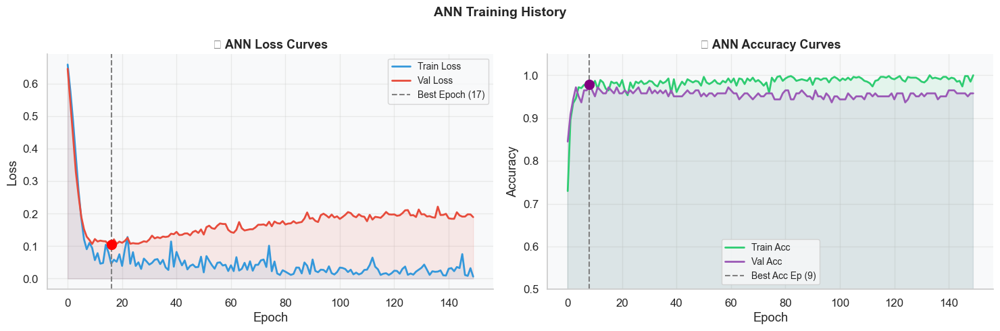

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

ax = axes[0]
ax.plot(train_losses, label='Train Loss', color='#3498db', linewidth=2)
ax.plot(val_losses,   label='Val Loss',   color='#e74c3c', linewidth=2)
ax.fill_between(range(EPOCHS), train_losses, alpha=0.1, color='#3498db')
ax.fill_between(range(EPOCHS), val_losses,   alpha=0.1, color='#e74c3c')
be = np.argmin(val_losses)
ax.axvline(be, color='gray', linestyle='--', linewidth=1.5, label=f'Best Epoch ({be+1})')
ax.scatter([be], [val_losses[be]], color='red', s=100, zorder=5)
ax.set_title('📉 ANN Loss Curves', fontsize=13, fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('Loss'); ax.legend(fontsize=10)

ax2 = axes[1]
ax2.plot(train_accs, label='Train Acc', color='#2ecc71', linewidth=2)
ax2.plot(val_accs,   label='Val Acc',   color='#9b59b6', linewidth=2)
ax2.fill_between(range(EPOCHS), train_accs, alpha=0.1, color='#2ecc71')
ax2.fill_between(range(EPOCHS), val_accs,   alpha=0.1, color='#9b59b6')
ba = np.argmax(val_accs)
ax2.axvline(ba, color='gray', linestyle='--', linewidth=1.5, label=f'Best Acc Ep ({ba+1})')
ax2.scatter([ba], [val_accs[ba]], color='purple', s=100, zorder=5)
ax2.set_title('🎯 ANN Accuracy Curves', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy'); ax2.legend(fontsize=10)
ax2.set_ylim(0.5, 1.05)

fig.suptitle('ANN Training History', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

## 📊 SECTION 19–21: Evaluasi (Confusion Matrix, ROC, PR)

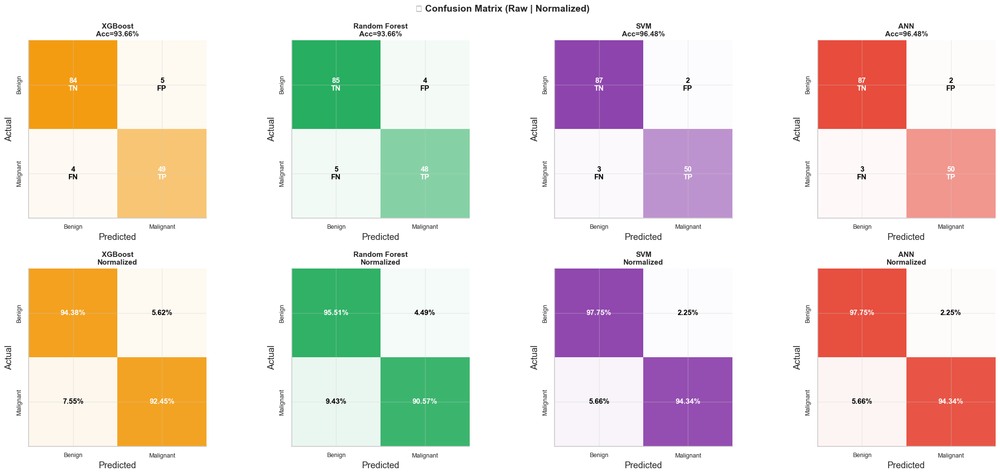

In [25]:
models_eval = [
    ('XGBoost',       y_pred_xgb, y_prob_xgb, '#f39c12'),
    ('Random Forest', y_pred_rf,  y_prob_rf,  '#27ae60'),
    ('SVM',           y_pred_svm, y_prob_svm, '#8e44ad'),
    ('ANN',           y_pred_ann, y_prob_ann, '#e74c3c'),
]
model_colors  = [m[3] for m in models_eval]
model_markers = ['o','s','^','D']

# ── CONFUSION MATRICES ────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(22, 10))
for col, (name, y_pred, y_prob, color) in enumerate(models_eval):
    cm_m = confusion_matrix(y_test, y_pred)
    acc  = accuracy_score(y_test, y_pred)
    cmap_c = LinearSegmentedColormap.from_list('c', ['#ffffff', color])

    for row_i, (data, title_sfx) in enumerate([
        (cm_m, f'Acc={acc*100:.2f}%'),
        (cm_m.astype(float)/cm_m.sum(axis=1,keepdims=True), 'Normalized')
    ]):
        ax = axes[row_i, col]
        vmax = 1.0 if row_i==1 else None
        ax.imshow(data, cmap=cmap_c, interpolation='nearest', vmin=0, vmax=vmax)
        ax.set_xticks([0,1]); ax.set_yticks([0,1])
        ax.set_xticklabels(['Benign','Malignant'],fontsize=9)
        ax.set_yticklabels(['Benign','Malignant'],fontsize=9,rotation=90,va='center')
        ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')
        ax.set_title(f'{name}\n{title_sfx}',fontsize=11,fontweight='bold')
        thresh = data.max()/2.0
        labels_map = {(0,0):'TN',(0,1):'FP',(1,0):'FN',(1,1):'TP'}
        for r in range(2):
            for c in range(2):
                val_str = f'{data[r,c]:.2%}' if row_i==1 else f'{int(data[r,c])}\n{labels_map[(r,c)]}'
                ax.text(c, r, val_str, ha='center', va='center',
                        fontsize=11, fontweight='bold',
                        color='white' if data[r,c]>thresh else 'black')

fig.suptitle('📊 Confusion Matrix (Raw | Normalized)',fontsize=14,fontweight='bold')
plt.tight_layout(); plt.show()

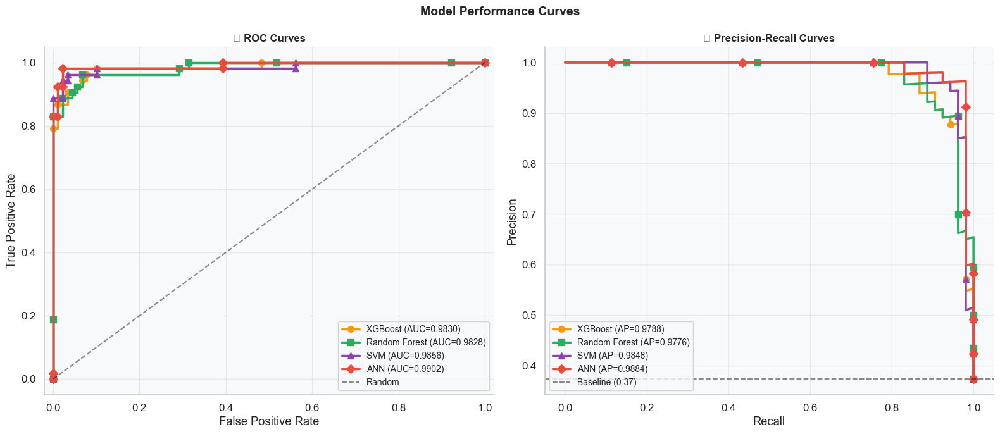

✅ ROC & PR Curves selesai.


In [26]:
# ── ROC + PR CURVES ───────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

ax_roc = axes[0]
ax_pr  = axes[1]
baseline = sum(y_test==1)/len(y_test)

for (name,y_pred,y_prob,_), color, marker in zip(models_eval, model_colors, model_markers):
    fpr,tpr,_ = roc_curve(y_test, y_prob)
    roc_auc   = auc(fpr, tpr)
    ax_roc.plot(fpr, tpr, color=color, linewidth=2.5, marker=marker,
                markevery=max(1,len(fpr)//8), markersize=7,
                label=f'{name} (AUC={roc_auc:.4f})')

    prec,rec,_ = precision_recall_curve(y_test, y_prob)
    ap = average_precision_score(y_test, y_prob)
    ax_pr.plot(rec, prec, color=color, linewidth=2.5, marker=marker,
               markevery=max(1,len(rec)//8), markersize=7,
               label=f'{name} (AP={ap:.4f})')

ax_roc.plot([0,1],[0,1],'k--',linewidth=1.5,alpha=0.5,label='Random')
ax_roc.set_xlabel('False Positive Rate'); ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('📈 ROC Curves',fontsize=12,fontweight='bold')
ax_roc.legend(fontsize=10,loc='lower right'); ax_roc.set_xlim(-0.02,1.02)

ax_pr.axhline(baseline, color='k', linestyle='--', linewidth=1.5, alpha=0.5,
               label=f'Baseline ({baseline:.2f})')
ax_pr.set_xlabel('Recall'); ax_pr.set_ylabel('Precision')
ax_pr.set_title('📉 Precision-Recall Curves',fontsize=12,fontweight='bold')
ax_pr.legend(fontsize=10,loc='lower left')

fig.suptitle('Model Performance Curves',fontsize=14,fontweight='bold')
plt.tight_layout(); plt.show()
print('✅ ROC & PR Curves selesai.')

## 🌟 SECTION 22: Feature Importance & Model Comparison

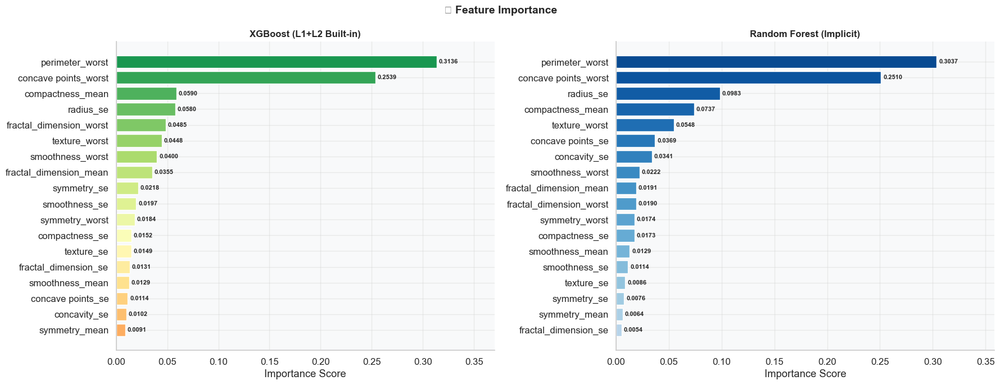

In [27]:
# Feature Importance
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, (model_obj, name, cmap_name) in zip(axes, [
    (xgb_model, 'XGBoost (L1+L2 Built-in)', 'RdYlGn'),
    (rf_model,  'Random Forest (Implicit)', 'Blues')
]):
    if hasattr(model_obj, 'feature_importances_'):
        fi = pd.Series(model_obj.feature_importances_, index=selected_features).sort_values(ascending=True)
        cmap_fi = plt.cm.get_cmap(cmap_name)
        cols = cmap_fi(np.linspace(0.3, 0.9, len(fi)))
        bars = ax.barh(fi.index, fi.values, color=cols, edgecolor='white')
        for bar, v in zip(bars, fi.values):
            ax.text(bar.get_width()+0.002, bar.get_y()+bar.get_height()/2,
                    f'{v:.4f}', va='center', fontsize=8, fontweight='bold')
        ax.set_title(f'{name}', fontsize=12, fontweight='bold')
        ax.set_xlabel('Importance Score')
        ax.set_xlim(0, fi.max()*1.18)
plt.suptitle('🌟 Feature Importance', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

🏆 RINGKASAN PERBANDINGAN MODEL


,Scaling,Accuracy,Precision,Recall,F1-Score,AUC-ROC,AP,Sensitivity,Specificity,Time (s)
Model,,,,,,,,,,
XGBoost,❌,0.9366,0.9074,0.9245,0.9159,0.9830,0.9788,0.9245,0.9438,1.70s
Random Forest,❌,0.9366,0.9231,0.9057,0.9143,0.9828,0.9776,0.9057,0.9551,1.99s
SVM,✅,0.9648,0.9615,0.9434,0.9524,0.9856,0.9848,0.9434,0.9775,0.06s
ANN,✅,0.9648,0.9615,0.9434,0.9524,0.9902,0.9884,0.9434,0.9775,52.04s


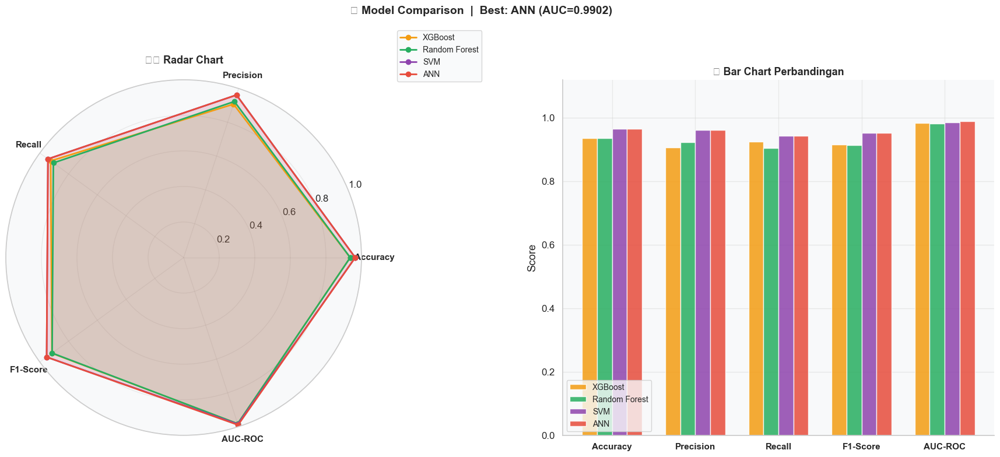


✅ MBDA Assignment 1 Pipeline selesai!


In [28]:
# ── FINAL COMPARISON TABLE ────────────────────────────────
timing = {'XGBoost':xgb_time, 'Random Forest':rf_time,
           'SVM':svm_time, 'ANN':ann_time}

results = []
for name, y_pred, y_prob, _ in models_eval:
    cm_m = confusion_matrix(y_test, y_pred)
    TP,TN,FP,FN = cm_m[1,1],cm_m[0,0],cm_m[0,1],cm_m[1,0]
    fpr,tpr,_ = roc_curve(y_test, y_prob)
    results.append({
        'Model'       : name,
        'Scaling'     : '❌' if name in ['XGBoost','Random Forest'] else '✅',
        'Accuracy'    : accuracy_score(y_test, y_pred),
        'Precision'   : precision_score(y_test, y_pred),
        'Recall'      : recall_score(y_test, y_pred),
        'F1-Score'    : f1_score(y_test, y_pred),
        'AUC-ROC'     : auc(fpr, tpr),
        'AP'          : average_precision_score(y_test, y_prob),
        'Sensitivity' : TP/(TP+FN) if (TP+FN)>0 else 0,
        'Specificity' : TN/(TN+FP) if (TN+FP)>0 else 0,
        'Time (s)'    : timing[name]
    })

results_df = pd.DataFrame(results).set_index('Model')
print('🏆 RINGKASAN PERBANDINGAN MODEL')
display(results_df.style
    .background_gradient(cmap='YlGn', subset=['Accuracy','F1-Score','AUC-ROC','AP'])
    .background_gradient(cmap='RdYlGn', subset=['Sensitivity','Specificity'])
    .background_gradient(cmap='RdYlGn_r', subset=['Time (s)'])
    .format({'Accuracy':'{:.4f}','Precision':'{:.4f}','Recall':'{:.4f}',
              'F1-Score':'{:.4f}','AUC-ROC':'{:.4f}','AP':'{:.4f}',
              'Sensitivity':'{:.4f}','Specificity':'{:.4f}','Time (s)':'{:.2f}s'})
)

# Radar + Bar chart
metrics_r = ['Accuracy','Precision','Recall','F1-Score','AUC-ROC']
nm = len(metrics_r)
angles = [n/float(nm)*2*np.pi for n in range(nm)] + [0]

fig = plt.figure(figsize=(18,8))

ax_r = fig.add_subplot(121, polar=True)
for (name,_,_,_), color in zip(models_eval, model_colors):
    vals = [results_df.loc[name,m] for m in metrics_r] + [results_df.loc[name,metrics_r[0]]]
    ax_r.plot(angles, vals, 'o-', linewidth=2, color=color, label=name)
    ax_r.fill(angles, vals, alpha=0.1, color=color)
ax_r.set_xticks(angles[:-1]); ax_r.set_xticklabels(metrics_r,fontsize=11,fontweight='bold')
ax_r.set_ylim(0,1); ax_r.set_title('🕸️ Radar Chart', fontsize=13, fontweight='bold', pad=20)
ax_r.legend(loc='upper right', bbox_to_anchor=(1.35,1.15), fontsize=10)

ax_b = fig.add_subplot(122)
x_pos = np.arange(len(metrics_r))
bw = 0.18
for i, (name,_,_,_) in enumerate(models_eval):
    vals = [results_df.loc[name,m] for m in metrics_r]
    ax_b.bar(x_pos+i*bw, vals, bw, label=name, color=model_colors[i], alpha=0.85, edgecolor='white')
ax_b.set_xticks(x_pos+bw*1.5); ax_b.set_xticklabels(metrics_r,fontsize=11,fontweight='bold')
ax_b.set_ylabel('Score'); ax_b.set_title('📊 Bar Chart Perbandingan',fontsize=13,fontweight='bold')
ax_b.legend(fontsize=10,loc='lower left'); ax_b.set_ylim(0,1.12)
ax_b.grid(axis='y',alpha=0.4)

best_m = results_df['AUC-ROC'].idxmax()
fig.suptitle(f'🏆 Model Comparison  |  Best: {best_m} (AUC={results_df.loc[best_m,"AUC-ROC"]:.4f})',
             fontsize=14,fontweight='bold')
plt.tight_layout(); plt.show()
print('\n✅ MBDA Assignment 1 Pipeline selesai!')